In [2]:
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt
import torch
from torchvision import transforms
from PIL import Image
import os
import pandas as pd
import math

from numpy import mean
from numpy import std
from numpy import absolute

from sklearn.model_selection import train_test_split, LeaveOneOut, cross_val_score, KFold
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import make_scorer,r2_score
from sklearn.svm import SVR

In [3]:
# Loading the images

image_path = 'All_Images'

desired_files = [file for file in os.listdir(image_path) if not file.startswith('.')]

imgs = []
names = []
for filename in desired_files:
    f = filename[:-4]

    last_seven_chars = f[-7:]
    
    min = 0
    
    image = Image.open(image_path + '/' + filename)
    img = np.array(image)

    x_shape = img.shape[0]
    y_shape = img.shape[1]

    if x_shape <= y_shape:
        min = x_shape
    else:
        min = y_shape

    val = min//14
    new_shape = val*14

    img_new = img[:new_shape, :new_shape, :3]

    imgs.append(img_new)
    names.append(f)

image_df = pd.DataFrame({'image': imgs, 'Image_Name':names})


In [4]:
# Loading the Vickers Hardness Values and merging dataframes

df = pd.read_excel('All_Images_Cut.xlsx')

merged_df = pd.merge(image_df,df, on='Image_Name')

In [5]:
def Convert_to_HV(gpa, hv):
    if hv == 'N/a': 
        return 1000/9.80665*gpa
    else:
        return hv

In [6]:
def Convert_to_GPA(gpa, hv):
    if gpa == 'N/a': 
        return 9.80665/1000*hv
    else:
        return gpa

In [7]:
# Iterate over each row in the dataframe
for index, row in merged_df.iterrows():
    gpa = row['Vickers Hardness (Gpa) ']
    hv = row['Vickers Hardness (HV)']
    merged_df.at[index, 'Vickers Hardness (HV)'] = Convert_to_HV(gpa, hv)
    merged_df.at[index, 'Vickers Hardness (Gpa) '] = Convert_to_GPA(gpa, hv)

In [8]:
xs = merged_df['image']
y = merged_df['Vickers Hardness (Gpa) ']

y = np.reshape(y,(-1, 1))

In [12]:
transform = transforms.Compose([
                transforms.ToTensor(), 
                 ])

def make_features(x_bin,model):

    img = Image.fromarray(x_bin)
    img_t = transform(img)
    img_t = img_t[None,:,:,:]

    return model(img_t).detach().numpy()

In [13]:
dinov2_vits14 = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14')
dinov2_vitb14 = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitb14')
dinov2_vitl14 = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitl14')
dinov2_vitg14 = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitg14')
    
x_features_small = []
x_features_base = []
x_features_large = []
x_features_giant = []

for x in xs:
    feature_small = make_features(x, dinov2_vits14)
    feature_base = make_features(x, dinov2_vitb14)
    feature_large = make_features(x, dinov2_vitl14)
    feature_giant = make_features(x, dinov2_vitg14)
    x_features_small.append(feature_small)
    x_features_base.append(feature_base)
    x_features_large.append(feature_large)
    x_features_giant.append(feature_giant)

x_features_small = np.array(x_features_small)
x_features_small = np.squeeze(x_features_small)

x_features_base = np.array(x_features_base)
x_features_base = np.squeeze(x_features_base)

x_features_large = np.array(x_features_large)
x_features_large = np.squeeze(x_features_large)

x_features_giant = np.array(x_features_giant)
x_features_giant = np.squeeze(x_features_giant)

print (x_features_small.shape, x_features_base.shape, x_features_large.shape, x_features_giant.shape)


Using cache found in C:\Users\sheila/.cache\torch\hub\facebookresearch_dinov2_main
Using cache found in C:\Users\sheila/.cache\torch\hub\facebookresearch_dinov2_main
Using cache found in C:\Users\sheila/.cache\torch\hub\facebookresearch_dinov2_main
Using cache found in C:\Users\sheila/.cache\torch\hub\facebookresearch_dinov2_main


(103, 384) (103, 768) (103, 1024) (103, 1536)


In [14]:
np.save('Experimental_small.npy', x_features_small)
np.save('Experimental_base.npy', x_features_base)
np.save('Experimental_large.npy', x_features_large)
np.save('Experimental_giant.npy', x_features_giant)

In [15]:
def basic_fit_pr(x,y):

    pca = PCA(
        svd_solver='full',
        n_components=5,
        random_state=10
    ).fit(x)

    x_red = pca.transform(x)

    poly = PolynomialFeatures(2)
    x_poly = poly.fit_transform(x_red)

    model = LinearRegression().fit(x_poly, y)

    y_hat = model.predict(x_poly)

    mape_train = np.mean(np.abs(y_hat-y)/y)

    #Plotting 
    x_vals = range(1,7)
    y_vals = range(1,7)
    plt.scatter(y,y_hat,color="grey")
    plt.plot(x_vals,y_vals)
    plt.xlabel('True hardness Gpa')
    plt.ylabel('Predicted hardness Gpa')
    plt.xlim(1,6)
    plt.ylim(1,6)
    plt.show()
        
    return mape_train

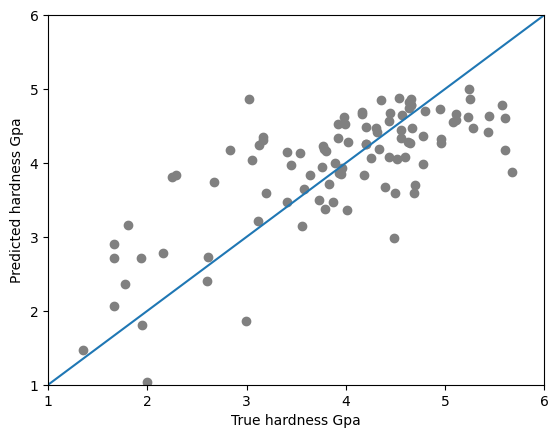

Small:0.163


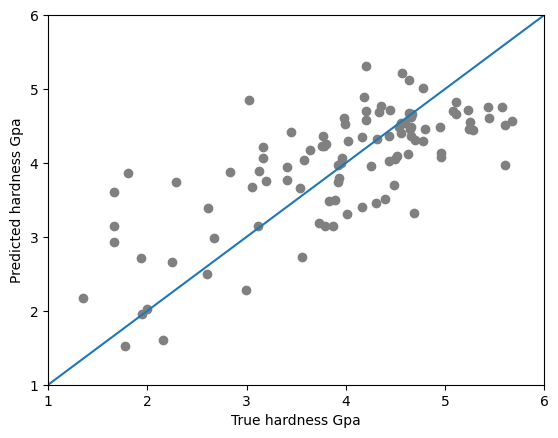

Base:0.175


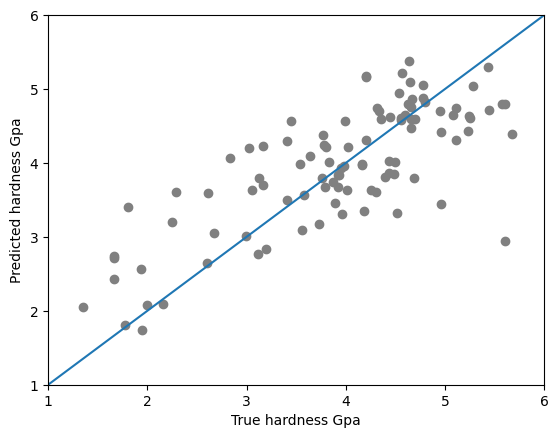

Large:0.150


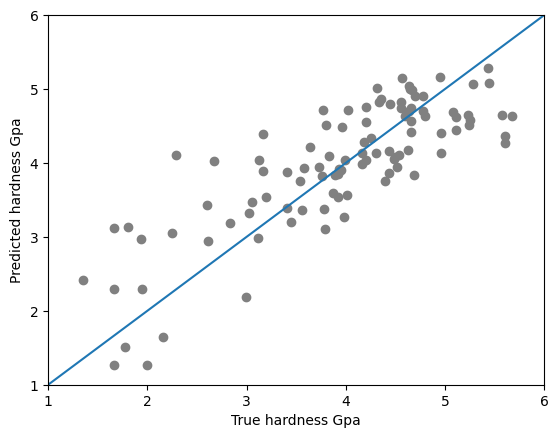

Giant:0.152


In [17]:
#Small Model 
mape_train_s = basic_fit_pr(x_features_small,y) 
print ('Small:%.3f' % (mape_train_s))

#Base Model 
mape_train_b = basic_fit_pr(x_features_base,y) 
print ('Base:%.3f' % (mape_train_b))

#Large Model 
mape_train_l = basic_fit_pr(x_features_large,y) 
print ('Large:%.3f' % (mape_train_l))

#Small Model 
mape_train_g = basic_fit_pr(x_features_giant,y) 
print ('Giant:%.3f' % (mape_train_g))

In [18]:
def MAPE(y, y_hat): 
    mape = np.mean(np.abs(y_hat-y)/y)*100
    return mape

mape_scorer = make_scorer(MAPE)

In [19]:
def RSME(y, y_hat): 
    rsme = np.sqrt(np.mean((y_hat-y)**2))
    return rsme
    
rsme_scorer = make_scorer(RSME)

In [20]:
def RSME_percentage(y, y_hat): 
    rsme = np.sqrt(np.mean((y_hat-y)**2))
    rsme = 100*rsme/np.mean(y_hat)
    return rsme
    
rsme_percent_scorer = make_scorer(RSME_percentage)

In [24]:
def count_terms(num_comps):
    num = num_comps + 2
    terms = math.factorial(num)/2 - 1
    return math.comb(num_comps + 2, 2)

In [33]:
# Analyzing MAPE score for PR using LeaveOneOut cross validation. 
def cv_pc_search(x_0,y_0,num_comp):

    cv = LeaveOneOut()

    pca = PCA(
            svd_solver='full',
            n_components=num_comp,
            random_state=10
        ).fit(x_0)
    
    #count_terms(num_comp)
    x_red = pca.transform(x_0)
    
    poly = PolynomialFeatures(2)
    x_poly = poly.fit_transform(x_red)
    
    model = LinearRegression().fit(x_poly, y_0)

    scores = cross_val_score(model, x_poly, y_0, scoring=mape_scorer, cv=cv, n_jobs=-1)

    print('Number of Components: %.0f, MAE: %.3f (%.3f)' % (num_comp,mean(scores), std(scores)))


In [23]:
x_0_s, x_test_s, y_0_s, y_test_s = train_test_split(x_features_small,y,test_size=0.1,random_state=11)
x_0_b, x_test_b, y_0_b, y_test_b = train_test_split(x_features_base,y,test_size=0.1,random_state=11)
x_0_l, x_test_l, y_0_l, y_test_l = train_test_split(x_features_large,y,test_size=0.1,random_state=11)
x_0_g, x_test_g, y_0_g, y_test_g = train_test_split(x_features_giant,y,test_size=0.1,random_state=11)

In [34]:
#Small Model 
num_comp = 1
num_terms = count_terms(num_comp)
print ('Small Model results')
while num_terms < len(x_0_s):
    cv_pc_search(x_0_s,y_0_s,num_comp)
    num_comp = num_comp + 1
    num_terms = count_terms(num_comp)

#Base Model
num_comp = 1
num_terms = count_terms(num_comp)
print ('Base Model results')
while num_terms < len(x_0_b):
    cv_pc_search(x_0_b,y_0_b,num_comp)
    num_comp = num_comp + 1
    num_terms = count_terms(num_comp)

#Large Model
num_comp = 1
num_terms = count_terms(num_comp)
print ('Large Model results')
while num_terms < len(x_0_l):
    cv_pc_search(x_0_l,y_0_l,num_comp)
    num_comp = num_comp + 1
    num_terms = count_terms(num_comp)

#Giant Model
num_comp = 1
num_terms = count_terms(num_comp)
print ('Giant Model results')
while num_terms < len(x_0_g):
    cv_pc_search(x_0_g,y_0_g,num_comp)
    num_comp = num_comp + 1
    num_terms = count_terms(num_comp)

Small Model results
Number of Components: 1, MAE: 24.241 (27.965)
Number of Components: 2, MAE: 23.476 (24.067)
Number of Components: 3, MAE: 21.305 (22.108)
Number of Components: 4, MAE: 23.735 (26.051)
Number of Components: 5, MAE: 24.790 (29.885)
Number of Components: 6, MAE: 35.535 (41.837)
Number of Components: 7, MAE: 41.801 (42.609)
Number of Components: 8, MAE: 42.084 (50.402)
Number of Components: 9, MAE: 60.092 (98.746)
Number of Components: 10, MAE: 34.321 (48.949)
Number of Components: 11, MAE: 45.523 (49.167)
Number of Components: 12, MAE: 1050.215 (4006.809)
Base Model results
Number of Components: 1, MAE: 26.208 (33.267)
Number of Components: 2, MAE: 24.448 (25.987)
Number of Components: 3, MAE: 22.733 (25.803)
Number of Components: 4, MAE: 23.658 (32.177)
Number of Components: 5, MAE: 24.898 (32.187)
Number of Components: 6, MAE: 51.914 (54.485)
Number of Components: 7, MAE: 24.784 (38.142)
Number of Components: 8, MAE: 27.177 (39.268)
Number of Components: 9, MAE: 29.4

In [40]:
def run_model_PR(x_train, y_train, x,y,num_comp):
    pca = PCA(
            svd_solver='full',
            n_components=num_comp,
            random_state=10
        ).fit(x_train)
    
    x_red = pca.transform(x_train)
    x_red_test = pca.transform(x)
    
    poly = PolynomialFeatures(2)
    
    x_poly_train = poly.fit_transform(x_red)
    x_poly_test = poly.fit_transform(x_red_test)
    
    model = LinearRegression().fit(x_poly_train, y_train)

    y_hat_train = model.predict(x_poly_train)

    rsme_train = np.sqrt(np.mean((y_hat_train-y_train)**2))
    rsme_train_percent = 100*rsme_train/np.mean(y_hat_train)
    r_squared_train = 1 - np.sum((y_train-y_hat_train)**2)/np.sum((y_train - np.mean(y_train))**2)

    residual_train = y_hat_train-y_train

    y_hat_test = model.predict(x_poly_test)
    
    rsme_test = np.sqrt(np.mean((y_hat_test-y)**2))
    rsme_test_percent = 100*rsme_test/np.mean(y_hat_test)
    r_squared_test = 1 - np.sum((y-y_hat_test)**2)/np.sum((y - np.mean(y))**2)
    
    residual_test = (y_hat_test-y)
    
    
    #('Train RSME (percent-RSME): %.3f (%.3f)' % (rsme_train, rsme_train_percent))
    print('Train RSME (percentRSME): %.3f (%.3f)' % (rsme_train, rsme_train_percent))
    print('Test RSME (percentRSME): %.3f (%.3f)' % (rsme_test, rsme_test_percent))
    print('Train R^2 : %.3f ' % (r_squared_train))
    print('Test R^2 : %.3f ' % (r_squared_test))

    #x_vals = range(1,8)#range(200,600)
    #y_vals = range(1,8)#range(200,600)
    plt.scatter(y_hat_train,residual_train,color="grey")
    plt.scatter(y_hat_test,residual_test,color="green")
    #plt.plot(x_vals,y_vals)
    ##plt.xlabel('True hardness Gpa')
    #plt.ylabel('Predicted hardness Gpa')
    #plt.xlim(1,7)#200,600)
    #plt.ylim(1,7)#200,600)
    plt.show()

    x_vals = range(1,8)#range(200,600)
    y_vals = range(1,8)#range(200,600)
    plt.scatter(y_train,y_hat_train,color="grey")
    plt.scatter(y,y_hat_test,color="green")
    plt.plot(x_vals,y_vals)
    plt.xlabel('True hardness Gpa')
    plt.ylabel('Predicted hardness Gpa')
    plt.xlim(1,7)#200,600)
    plt.ylim(1,7)#200,600)
    plt.show()
                

    


Small Model with 3 PCs
Train RSME (percentRSME): 0.817 (20.613)
Test RSME (percentRSME): 0.590 (14.444)
Train R^2 : 0.470 
Test R^2 : -0.202 


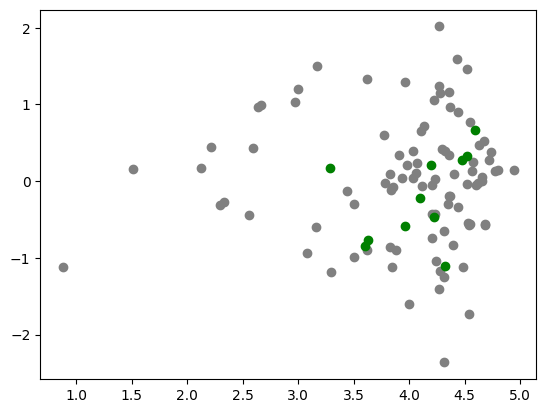

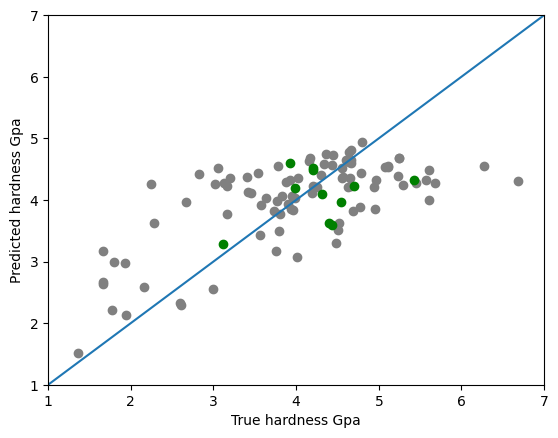

Base Model with 3 PCs
Train RSME (percentRSME): 0.868 (21.910)
Test RSME (percentRSME): 0.695 (17.377)
Train R^2 : 0.402 
Test R^2 : -0.669 


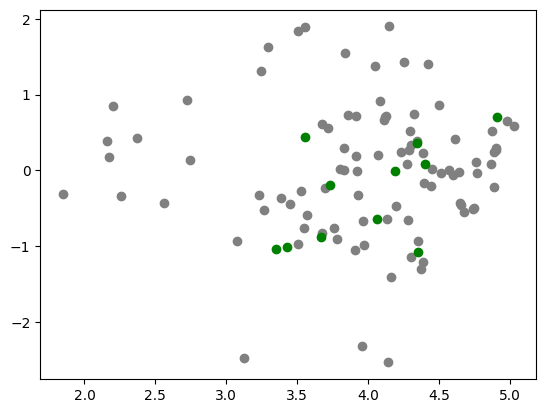

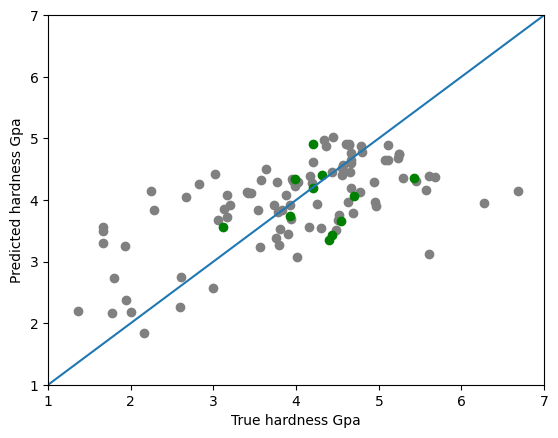

Large Model with 4 PCs
Train RSME (percentRSME): 0.752 (18.974)
Test RSME (percentRSME): 0.591 (14.555)
Train R^2 : 0.551 
Test R^2 : -0.206 


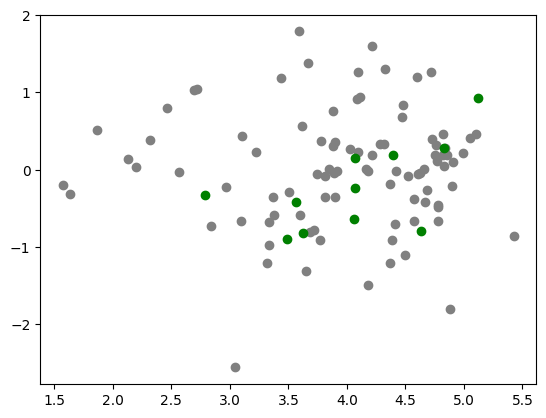

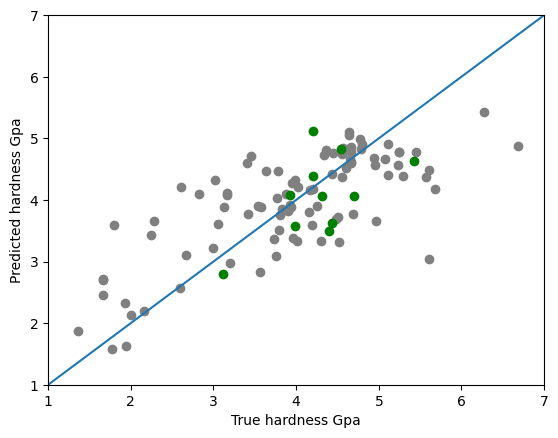

Giant Model with 5 PCs
Train RSME (percentRSME): 0.627 (15.833)
Test RSME (percentRSME): 0.638 (15.566)
Train R^2 : 0.688 
Test R^2 : -0.405 


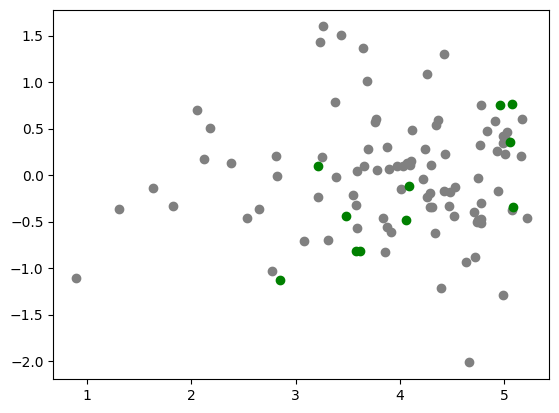

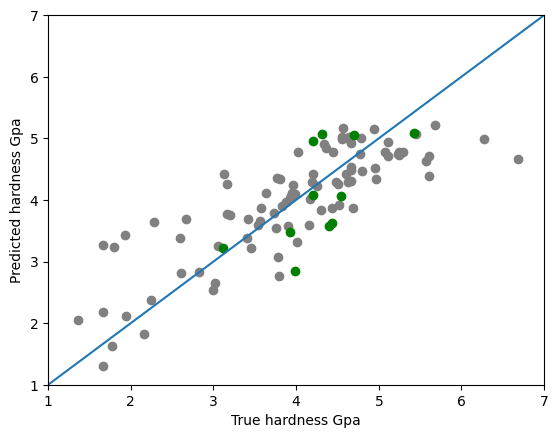

In [41]:
#Best Small Model Results
print ('Small Model with 3 PCs')
run_model_PR(x_0_s, y_0_s, x_test_s, y_test_s, 3)

#Best Base Model Results 
print ('Base Model with 3 PCs')
run_model_PR(x_0_b, y_0_b, x_test_b, y_test_b, 3)

#Best Large Model Results
print ('Large Model with 4 PCs')
run_model_PR(x_0_l, y_0_l, x_test_l, y_test_l, 4)

#Best Giant Model Results
print ('Giant Model with 5 PCs')
run_model_PR(x_0_g, y_0_g, x_test_g, y_test_g, 5)

In [46]:
def cv_pc_search_svr(x_0,y_0,num_comp,kernal_name):

    cv = LeaveOneOut()

    pca = PCA(
            svd_solver='full',
            n_components=num_comp,
            random_state=10
        ).fit(x_0)
    
    count_terms(num_comp)
    x_red = pca.transform(x_0)

    model = SVR(kernel=kernal_name) 
    # evaluate model
    scores = cross_val_score(model, x_red, y_0, scoring=rsme_scorer, cv=cv, n_jobs=-1)

    print('Number of Components: %.0f, RSME: %.3f (%.3f)' % (num_comp,mean(scores), std(scores)))

    return (mean(scores))


In [49]:
#Small Model 
print ('Small Model results')
min_comp_s = 100
min_rsme_s = 100
for num_comp in range(1,len(x_0_s),1): 
    rsme_s = cv_pc_search_svr(x_0_s,y_0_s,num_comp,'linear')
    if rsme_s < min_rsme_s:
        min_rsme_s = rsme_s
        min_comp_s = num_comp
print ('Small results: Number of Components: %.0f, Min RSME: %.3f' % (min_comp_s, min_rsme_s))
        
#Base Model
print ('Base Model results')
min_comp_b = 100
min_rsme_b = 100
for num_comp in range(1,len(x_0_b),1):
    rsme_b = cv_pc_search_svr(x_0_b,y_0_b,num_comp,'linear')
    if rsme_b < min_rsme_b:
        min_rsme_b = rsme_b
        min_comp_b = num_comp 
print ('Base results: Number of Components: %.0f, Min RSME: %.3f' % (min_comp_b, min_rsme_b))
        
#Large Model
print ('Large Model results')
min_comp_l = 100
min_rsme_l = 100
for num_comp in range(1,len(x_0_l),1):
    rsme_l = cv_pc_search_svr(x_0_l,y_0_l,num_comp,'linear')
    if rsme_l < min_rsme_l:
        min_rsme_l = rsme_l
        min_comp_l = num_comp
print ('Large results: Number of Components: %.0f, Min RSME: %.3f' % (min_comp_l, min_rsme_l))

#Giant Model
print ('Giant Model results')
min_comp_g = 100
min_rsme_g = 100
for num_comp in range(1,len(x_0_g),1):
    rsme_g = cv_pc_search_svr(x_0_g,y_0_g,num_comp,'linear')
    if rsme_g < min_rsme_g:
        min_rsme_g = rsme_g
        min_comp_g = num_comp
print ('Giant results: Number of Components: %.0f, Min RSME: %.3f' % (min_comp_g, min_rsme_g))


Small Model results
Number of Components: 1, RSME: 0.789 (0.672)
Number of Components: 2, RSME: 0.756 (0.634)
Number of Components: 3, RSME: 0.726 (0.593)
Number of Components: 4, RSME: 0.688 (0.657)
Number of Components: 5, RSME: 0.708 (0.668)
Number of Components: 6, RSME: 0.697 (0.670)
Number of Components: 7, RSME: 0.786 (0.722)
Number of Components: 8, RSME: 0.667 (0.736)
Number of Components: 9, RSME: 0.731 (0.729)
Number of Components: 10, RSME: 0.734 (0.722)
Number of Components: 11, RSME: 0.751 (0.733)
Number of Components: 12, RSME: 0.752 (0.753)
Number of Components: 13, RSME: 0.762 (0.736)
Number of Components: 14, RSME: 0.711 (0.777)
Number of Components: 15, RSME: 0.758 (0.823)
Number of Components: 16, RSME: 0.799 (0.791)
Number of Components: 17, RSME: 0.829 (0.795)
Number of Components: 18, RSME: 0.809 (0.715)
Number of Components: 19, RSME: 0.847 (0.808)
Number of Components: 20, RSME: 0.658 (0.716)
Number of Components: 21, RSME: 0.672 (0.720)
Number of Components: 2

In [17]:
def run_model_svr(x_train, y_train, x,y,num_comp,kernal_name):
    pca = PCA(
            svd_solver='full',
            n_components=num_comp,
            random_state=10
        ).fit(x_train)
    
    x_red = pca.transform(x_train)
    x_red_test = pca.transform(x)

    model = SVR(kernel=kernal_name).fit(x_red,y_train)

    y_hat_train = model.predict(x_red)

    y_hat_train = y_hat_train.reshape(-1,1)


    rsme_train = np.sqrt(np.mean((y_hat_train-y_train)**2))
    rsme_train_percent = 100*rsme_train/np.mean(y_hat_train)
    r_squared_train = 1 - np.sum((y_train-y_hat_train)**2)/np.sum((y_train - np.mean(y_train))**2)

    residual_train = y_hat_train-y_train

    y_hat_test = model.predict(x_red_test)

    y_hat_test = y_hat_test.reshape(-1,1)
    
    rsme_test = np.sqrt(np.mean((y_hat_test-y)**2))
    rsme_test_percent = 100*rsme_test/np.mean(y_hat_test)
    r_squared_test = 1 - np.sum((y-y_hat_test)**2)/np.sum((y - np.mean(y))**2)
    
    residual_test = (y_hat_test-y)
    
    
    #('Train RSME (percent-RSME): %.3f (%.3f)' % (rsme_train, rsme_train_percent))
    print('Train RSME (percentRSME): %.3f (%.3f)' % (rsme_train, rsme_train_percent))
    print('Test RSME (percentRSME): %.3f (%.3f)' % (rsme_test, rsme_test_percent))
    print('Train R^2 : %.3f ' % (r_squared_train))
    print('Test R^2 : %.3f ' % (r_squared_test))

    #x_vals = range(1,8)#range(200,600)
    #y_vals = range(1,8)#range(200,600)
    # plt.scatter(y_hat_train,residual_train,color="grey")
    # plt.scatter(y_hat_test,residual_test,color="green")
    # #plt.plot(x_vals,y_vals)
    # ##plt.xlabel('True hardness Gpa')
    # #plt.ylabel('Predicted hardness Gpa')
    # #plt.xlim(1,7)#200,600)
    # #plt.ylim(1,7)#200,600)
    # plt.show()

    # x_vals = range(1,8)#range(200,600)
    # y_vals = range(1,8)#range(200,600)
    # plt.scatter(y_train,y_hat_train,color="grey")
    # plt.scatter(y,y_hat_test,color="green")
    # plt.plot(x_vals,y_vals, color = 'black')
    # plt.xlabel('True hardness Gpa')
    # plt.ylabel('Predicted hardness Gpa')
    # plt.xlim(1,7)#200,600)
    # plt.ylim(1,7)#200,600)
    # plt.show()


    # Create a square figure
    fig = plt.figure(figsize=(6, 6))  # 6x6 inches square figure
    
    # Plot data
    x_vals = range(1,8)#range(200,600)
    y_vals = range(1,8)
    plt.scatter(y_train,y_hat_train,color="grey")
    plt.scatter(y,y_hat_test,color="green")
    plt.plot(x_vals,y_vals, color = 'black')
    plt.xlabel('True hardness GPa', fontsize = 18)
    plt.ylabel('Predicted hardness GPa', fontsize = 18)
    plt.xlim(1,7)#200,600)
    plt.ylim(1,7)#200,600)
    # Set equal scaling by setting aspect ratio to 'equal'
    plt.gca().set_aspect('equal', adjustable='box')
    
    # Save the figure as a PDF file
    name = str(num_comp) + '.pdf'
    plt.savefig(name, format='pdf')
    
    # Show the plot
    plt.show()

    


Small Model with 28 PCs


C:\Users\sheila\Documents\Py_Env\Lib\site-packages\sklearn\utils\validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Train RSME (percentRSME): 0.522 (13.190)
Test RSME (percentRSME): 0.373 (9.203)
Train R^2 : 0.784 
Test R^2 : 0.520 


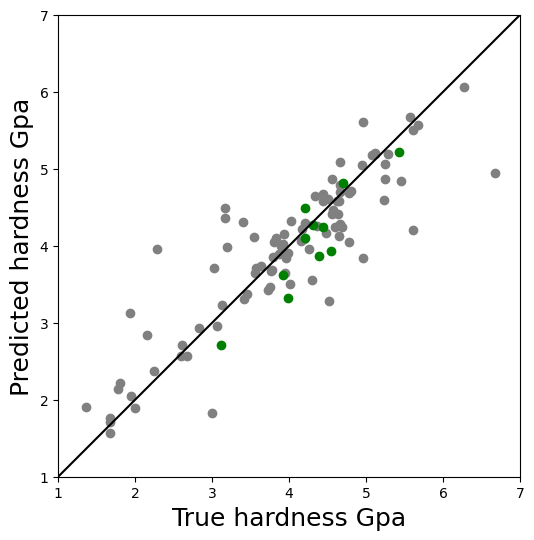

Base Model with 26 PCs


C:\Users\sheila\Documents\Py_Env\Lib\site-packages\sklearn\utils\validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Train RSME (percentRSME): 0.524 (13.225)
Test RSME (percentRSME): 0.405 (9.300)
Train R^2 : 0.782 
Test R^2 : 0.435 


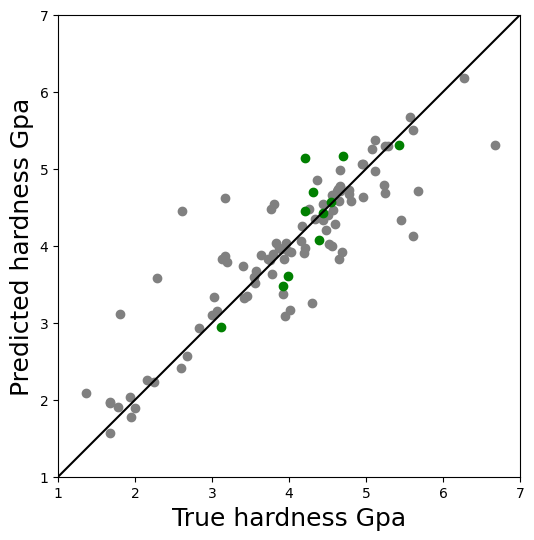

Large Model with 22 PCs


C:\Users\sheila\Documents\Py_Env\Lib\site-packages\sklearn\utils\validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Train RSME (percentRSME): 0.512 (13.029)
Test RSME (percentRSME): 0.533 (12.659)
Train R^2 : 0.792 
Test R^2 : 0.020 


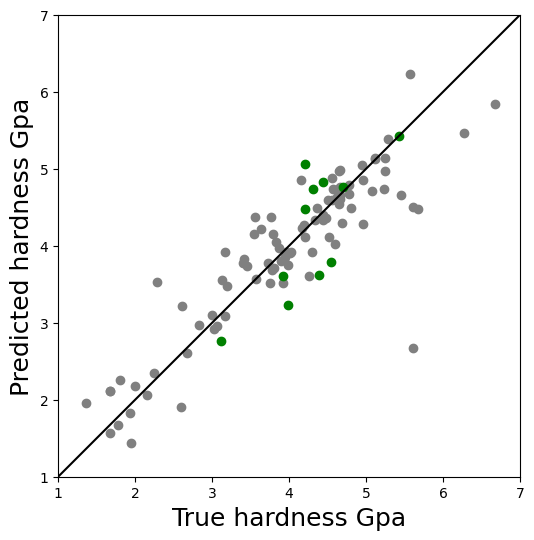

Giant Model with 20 PCs


C:\Users\sheila\Documents\Py_Env\Lib\site-packages\sklearn\utils\validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Train RSME (percentRSME): 0.553 (14.121)
Test RSME (percentRSME): 0.528 (13.125)
Train R^2 : 0.757 
Test R^2 : 0.036 


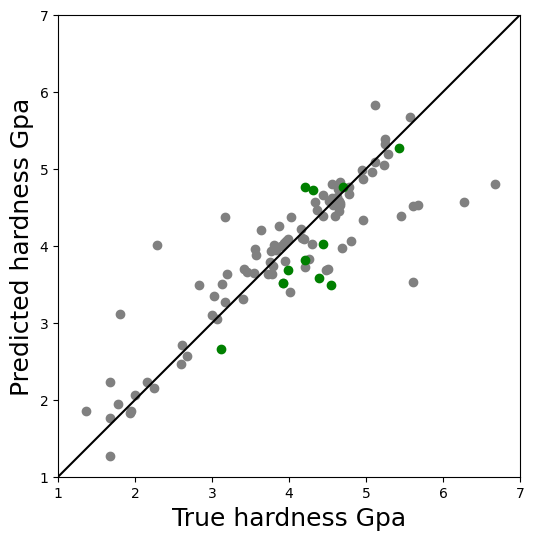

In [69]:
#Best Small Model Results
print ('Small Model with 28 PCs')
run_model_svr(x_0_s, y_0_s, x_test_s, y_test_s, 28,'linear')

#Best Base Model Results 
print ('Base Model with 26 PCs')
run_model_svr(x_0_b, y_0_b, x_test_b, y_test_b, 26,'linear')

#Best Large Model Results
print ('Large Model with 22 PCs')
run_model_svr(x_0_l, y_0_l, x_test_l, y_test_l, 22,'linear')

#Best Giant Model Results
print ('Giant Model with 20 PCs')
run_model_svr(x_0_g, y_0_g, x_test_g, y_test_g, 20,'linear')

(103, 1000)


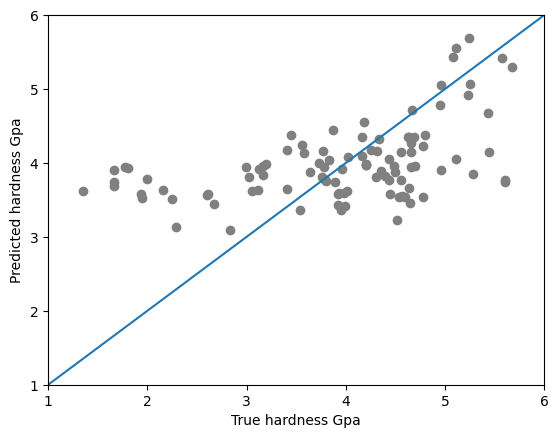

Nasa:0.239
(92, 1000)
NASA Model results
Number of Components: 1, RSME: 0.901 (0.709)
Number of Components: 2, RSME: 0.923 (0.684)
Number of Components: 3, RSME: 0.812 (0.802)
Number of Components: 4, RSME: 0.823 (0.811)
Number of Components: 5, RSME: 0.835 (0.810)
Number of Components: 6, RSME: 0.836 (0.774)
Number of Components: 7, RSME: 0.841 (0.768)
Number of Components: 8, RSME: 0.848 (0.772)
Number of Components: 9, RSME: 0.893 (0.789)
Number of Components: 10, RSME: 0.787 (0.792)
Number of Components: 11, RSME: 0.815 (0.809)
Number of Components: 12, RSME: 0.830 (0.807)
Number of Components: 13, RSME: 0.811 (0.802)
Number of Components: 14, RSME: 0.851 (0.817)
Number of Components: 15, RSME: 0.907 (0.795)
Number of Components: 16, RSME: 0.903 (0.805)
Number of Components: 17, RSME: 0.951 (0.845)
Number of Components: 18, RSME: 0.916 (0.853)
Number of Components: 19, RSME: 0.928 (0.849)
Number of Components: 20, RSME: 0.965 (0.858)
Number of Components: 21, RSME: 1.027 (0.960)
Nu

In [105]:
# Exploring NASA features

nasa_features = np.load('NASA_features_correct2.npy')
print (nasa_features.shape)

mape_train_nasa = basic_fit_pr(nasa_features,y) 
print ('Nasa:%.3f' % (mape_train_nasa))

x_0_nasa, x_test_nasa, y_0_nasa, y_test_nasa = train_test_split(nasa_features,y,test_size=0.1,random_state=11)
print (x_0_nasa.shape)

#Giant Model
print ('NASA Model results')
min_comp_nasa = 100
min_rsme_nasa = 100
for num_comp in range(1,len(x_0_nasa),1):
    rsme_nasa = cv_pc_search_svr(x_0_nasa,y_0_nasa,num_comp,'linear')
    if rsme_nasa < min_rsme_nasa:
        min_rsme_nasa = rsme_nasa
        min_comp_nasa = num_comp
print ('NASA results: Number of Components: %.0f, Min RSME: %.3f' % (min_comp_nasa, min_rsme_nasa))

NASA Model with 10 PCs
Train RSME (percentRSME): 1.077 (25.657)
Test RSME (percentRSME): 0.618 (15.230)
Train R^2 : 0.078 
Test R^2 : -0.318 


C:\Users\sheila\Documents\Py_Env\Lib\site-packages\sklearn\utils\validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


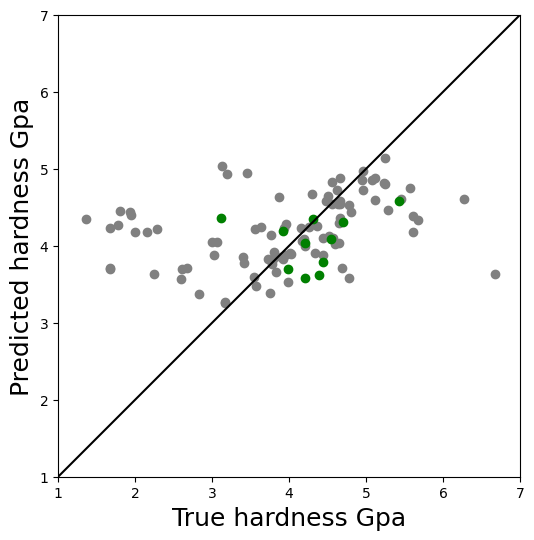

In [106]:
#Best NASA Model Results
print ('NASA Model with 10 PCs')
run_model_svr(x_0_nasa, y_0_nasa, x_test_nasa, y_test_nasa, 10,'linear')

In [58]:
#Giant Model
print ('NASA Model results')
for num_comp in range(1,len(x_0_nasa),1):
    cv_pc_search(x_0_nasa,y_0_nasa,num_comp)

NASA Model results
Number of Components: 1, MAE: 31.169 (42.830)
Number of Components: 2, MAE: 31.598 (44.611)
Number of Components: 3, MAE: 31.162 (42.652)
Number of Components: 4, MAE: 30.278 (41.228)
Number of Components: 5, MAE: 32.037 (40.543)
Number of Components: 6, MAE: 34.988 (40.715)
Number of Components: 7, MAE: 48.977 (52.107)
Number of Components: 8, MAE: 37.993 (54.316)
Number of Components: 9, MAE: 56.238 (61.645)
Number of Components: 10, MAE: 88.129 (115.867)
Number of Components: 11, MAE: 83.078 (86.964)
Number of Components: 12, MAE: 2615.497 (8725.343)
Number of Components: 13, MAE: 118.489 (121.443)
Number of Components: 14, MAE: 128.262 (123.923)
Number of Components: 15, MAE: 88.490 (101.607)
Number of Components: 16, MAE: 67.226 (71.410)
Number of Components: 17, MAE: 72.352 (70.833)
Number of Components: 18, MAE: 68.338 (75.538)
Number of Components: 19, MAE: 63.523 (64.990)
Number of Components: 20, MAE: 57.458 (56.368)
Number of Components: 21, MAE: 60.495 (6

In [80]:
#Exploring Features
def Explore_features(features):
    maxs = np.amax(features, axis=0)
    mins = np.amin(features, axis=0)

    # print (maxs.shape)
    # print (mins.shape)

    ranges = maxs - mins
    
    range_sorted = np.sort(ranges)
    range_sorted = range_sorted[-10:]
    
    # print (ranges)
    # print (len(range_sorted))
    # print (ranges.shape)
    
    ranges = ranges.tolist()
    
    indexs = []
    for val in range_sorted:
        indexs.append(ranges.index(val))

    for val in indexs:
        feature_spectra = features[:,val]
    
        plt.ylim([-12,12])
        plt.plot(feature_spectra)
        plt.show()
    
        max_img = np.argmax(feature_spectra)
        min_img = np.argmin(feature_spectra)
    
        plt.imshow(xs[max_img])
        plt.show()
    
        plt.imshow(xs[min_img])
        plt.show()


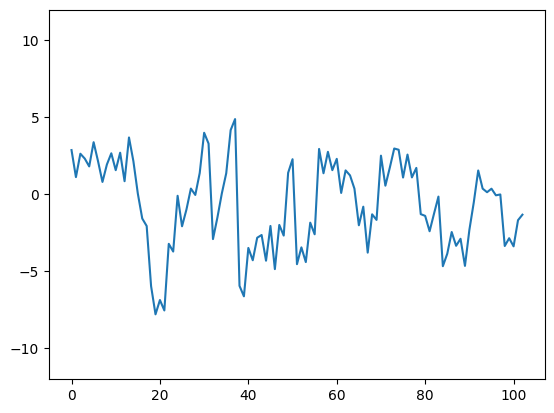

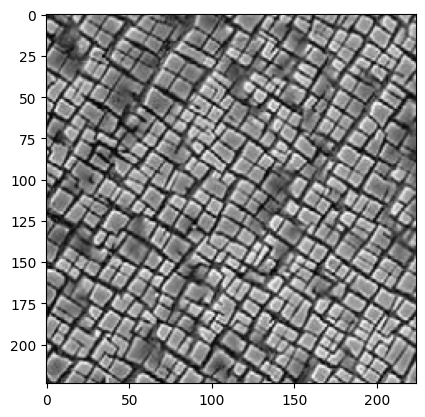

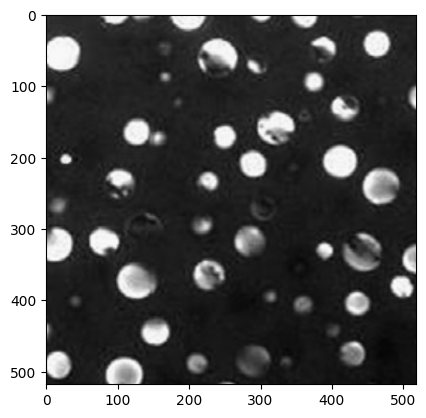

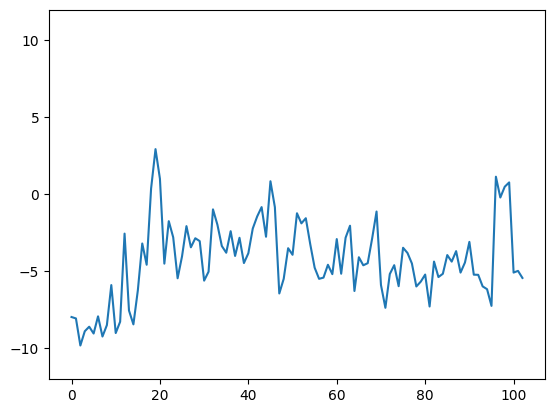

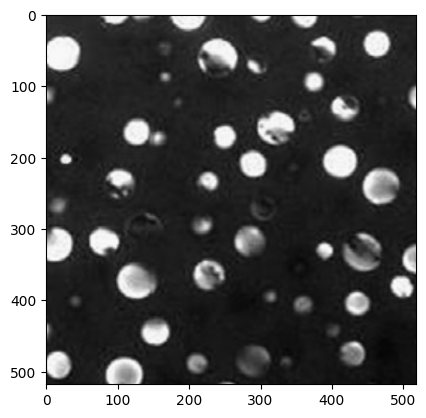

...

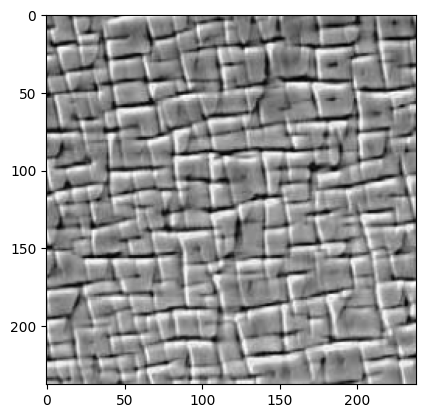

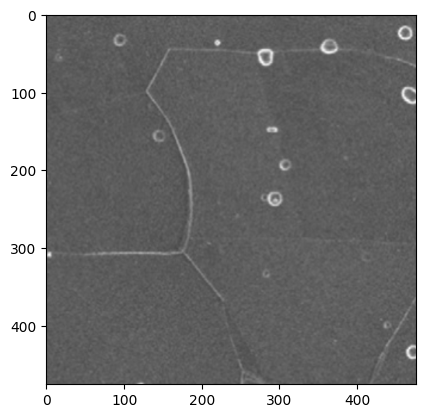

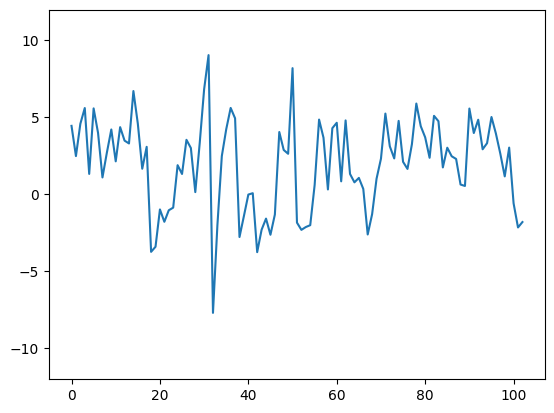

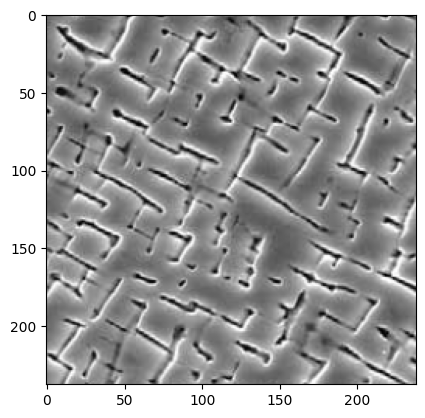

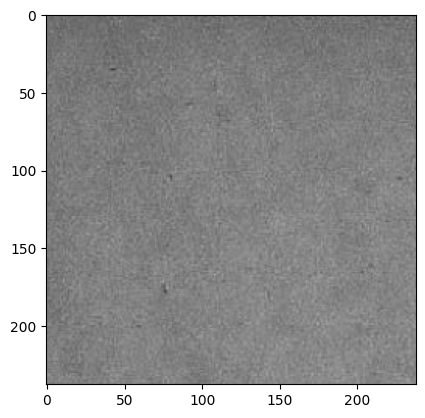

In [81]:
Explore_features(x_features_small)

In [1]:
print (x_features_small)

NameError: name 'x_features_small' is not defined

In [14]:
def Scatter_PCA(X):
    pca = PCA(
        svd_solver='full',
        n_components=2,
        random_state=10
    ).fit(X)

    pca_train = pca.transform(X)
    print (pca_train.shape)

    max1 = np.argmax(pca_train[:,0])
    min1 = np.argmin(pca_train[:,0])
    max2 = np.argmax(pca_train[:,1])
    min2 = np.argmin(pca_train[:,1])

    # Sort the indices based on the values of the first column
    sorted_indices_col1 = np.argsort(pca_train[:, 0])
    min1_2 = sorted_indices_col1[1]
    max1_2 = sorted_indices_col1[-2]
    
    # Sort the indices based on the values of the second column
    sorted_indices_col2 = np.argsort(pca_train[:, 1])
    min2_2 = sorted_indices_col2[1]
    max2_2 = sorted_indices_col2[-2]

    #COLORSS
    #DF873E - orange - CNN
    #69E374 - green - truth
    #EA334B - red
    #52B5F9 - blue - RF

    plt.scatter(pca_train[:,0],pca_train[:,1],zorder = 1, c = '#52B5F9')
    plt.scatter(pca_train[max1,0],pca_train[max1,1],zorder = 2, c = '#69E374')
    plt.scatter(pca_train[max1_2,0],pca_train[max1_2,1],zorder = 2, c = '#69E374')
    plt.scatter(pca_train[min1,0],pca_train[min1,1],zorder = 2, c = '#EA334B')
    plt.scatter(pca_train[min1_2,0],pca_train[min1_2,1],zorder = 2, c = '#EA334B')
    plt.scatter(pca_train[max2,0],pca_train[max2,1],zorder = 2, c = '#DF873E')
    plt.scatter(pca_train[max2_2,0],pca_train[max2_2,1],zorder = 2, c = '#DF873E')
    plt.scatter(pca_train[min2,0],pca_train[min2,1],zorder = 2, c = 'black')
    plt.scatter(pca_train[min2_2,0],pca_train[min2_2,1],zorder = 2, c = 'black')
    plt.show()

    x = xs

    plt.title('Green')
    plt.imshow(x[max1],cmap = "binary")
    plt.show()
    plt.title('Green')
    plt.imshow(x[max1_2],cmap = "binary")
    plt.show()

    plt.title('Red')
    plt.imshow(x[min1],cmap = "binary")
    plt.show()
    plt.title('Red')
    plt.imshow(x[min1_2],cmap = "binary")
    plt.show()

    plt.title('Orange')
    plt.imshow(x[max2],cmap = "binary")
    plt.show()
    plt.title('Orange')
    plt.imshow(x[max2_2],cmap = "binary")
    plt.show()

    plt.title('Black')
    plt.imshow(x[min2],cmap = "binary")
    plt.show()
    plt.title('Black')
    plt.imshow(x[min2_2],cmap = "binary")
    plt.show()

    return

(103, 2)


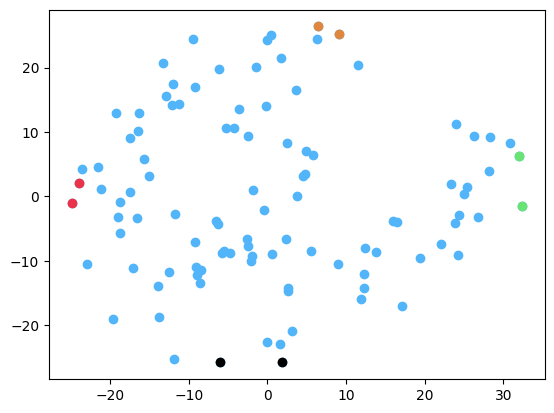

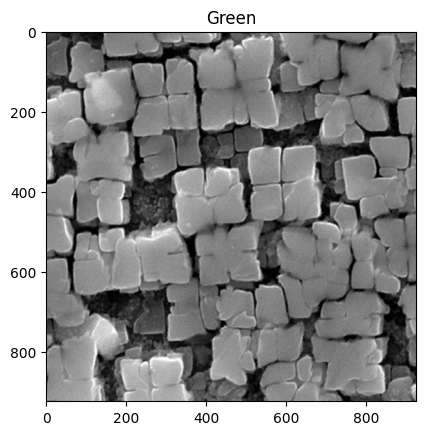

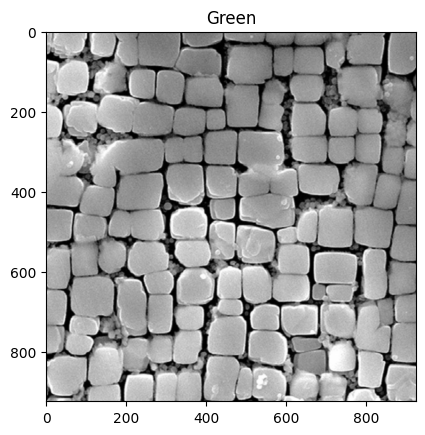

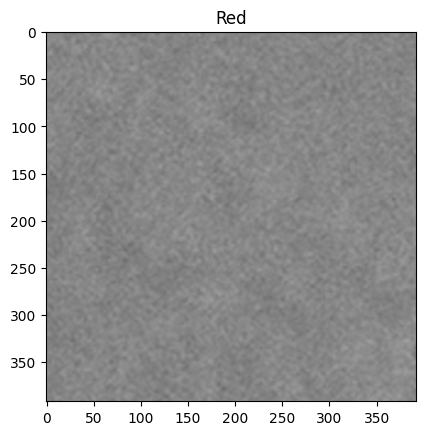

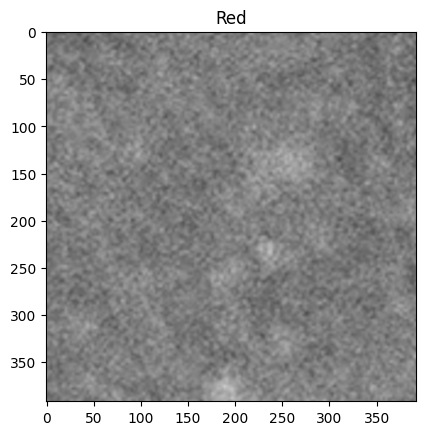

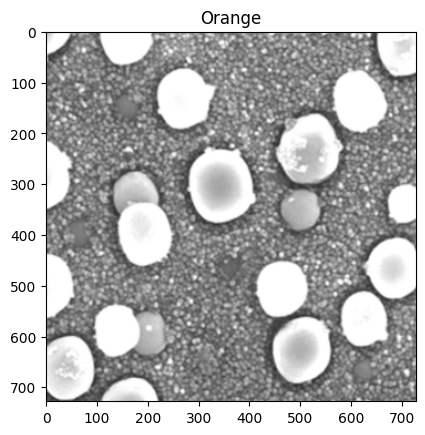

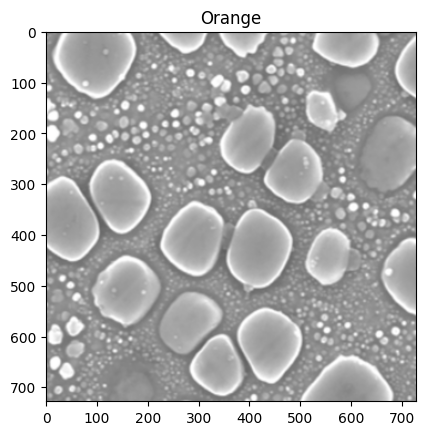

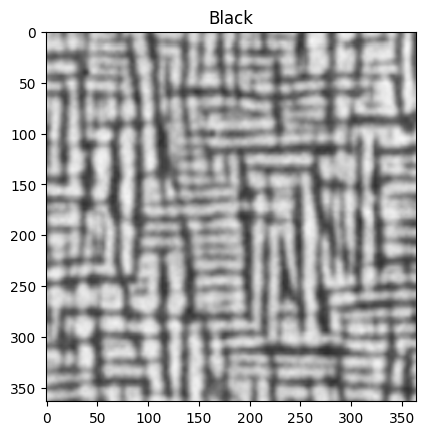

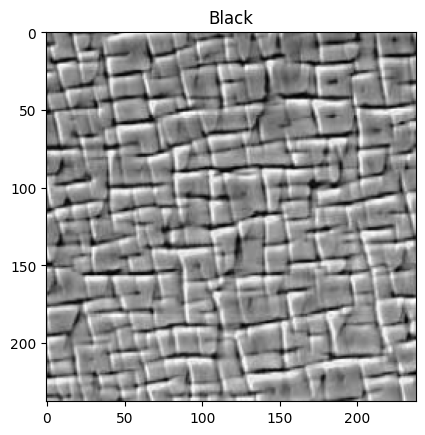

In [15]:
small = np.load('Experimental_small.npy')
Scatter_PCA(small)

In [16]:
x_0_s, x_test_s, y_0_s, y_test_s = train_test_split(small,y,test_size=0.1,random_state=11)

Small Model with 28 PCs


C:\Users\sheila\Documents\Py_Env\Lib\site-packages\sklearn\utils\validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Train RSME (percentRSME): 0.522 (13.190)
Test RSME (percentRSME): 0.373 (9.203)
Train R^2 : 0.784 
Test R^2 : 0.520 


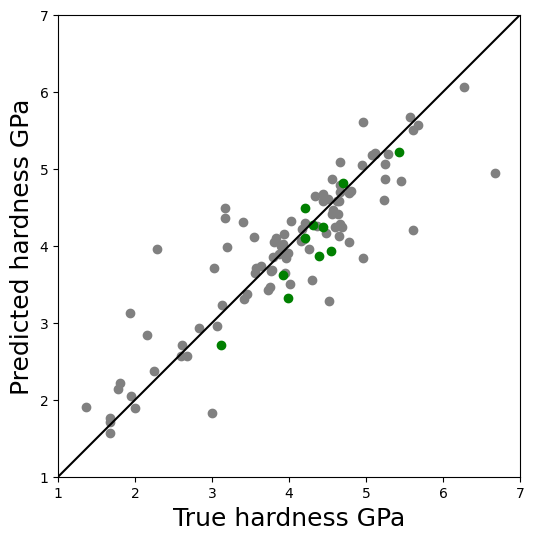

In [18]:
#Best Small Model Results
print ('Small Model with 28 PCs')
run_model_svr(x_0_s, y_0_s, x_test_s, y_test_s, 28,'linear')

(103, 2)


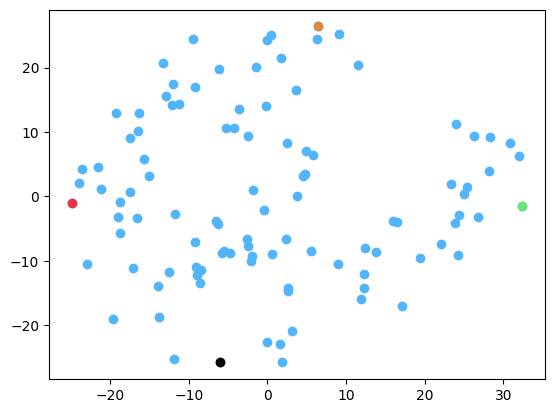

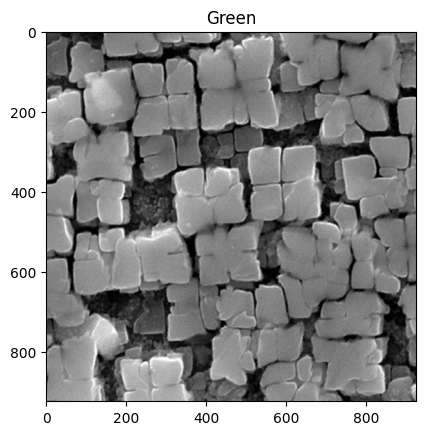

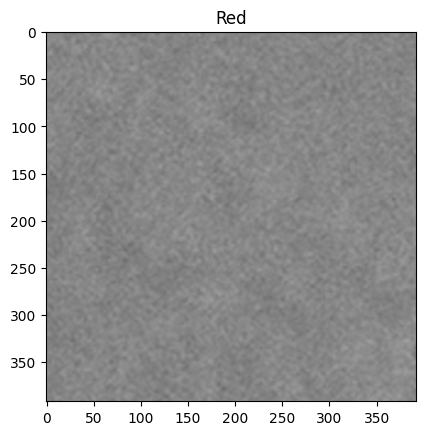

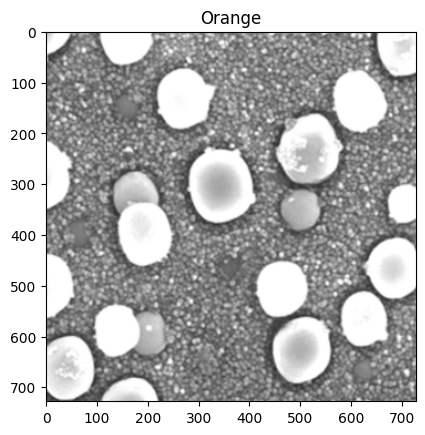

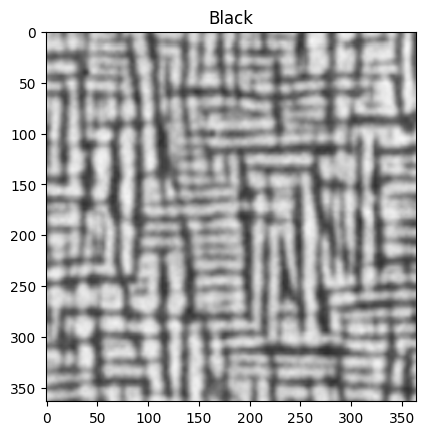

(103, 2)


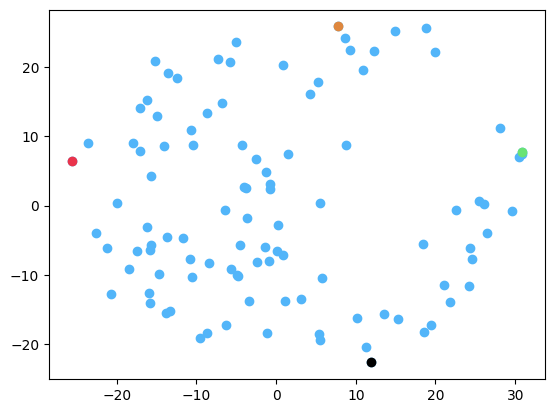

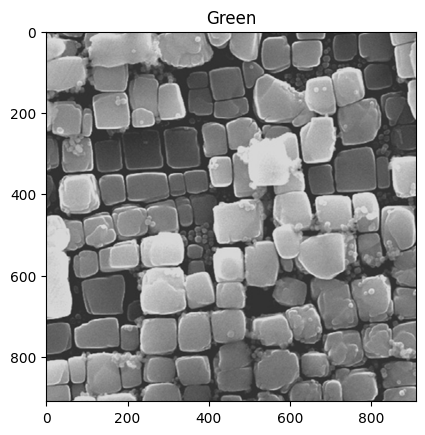

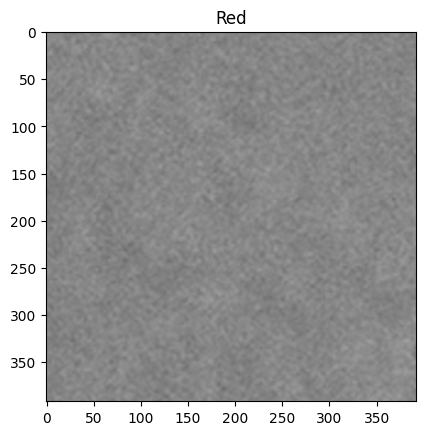

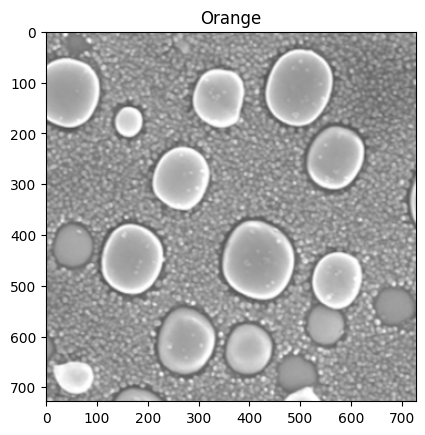

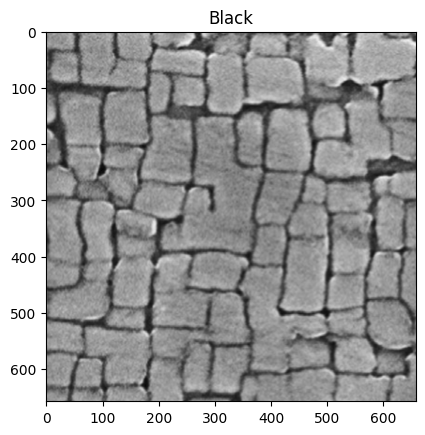

(103, 2)


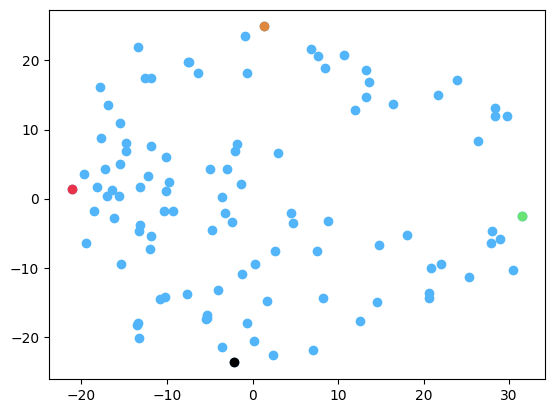

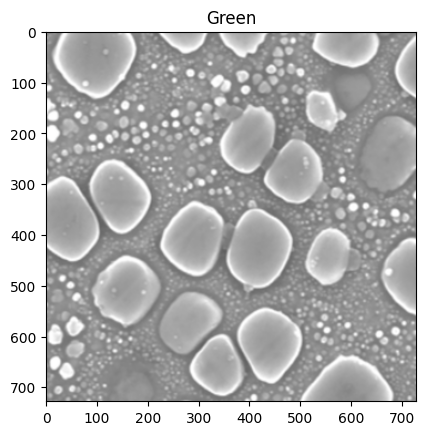

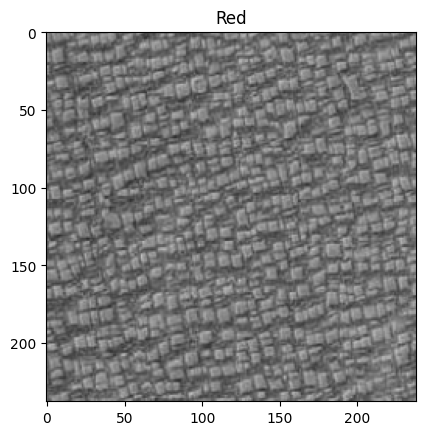

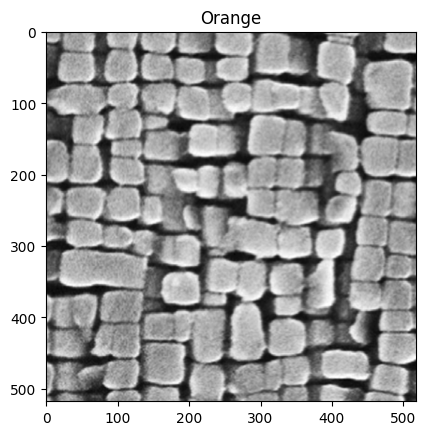

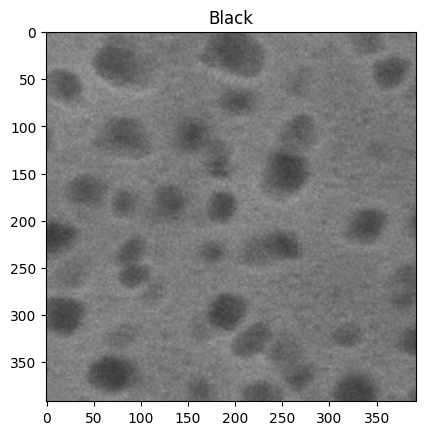

(103, 2)


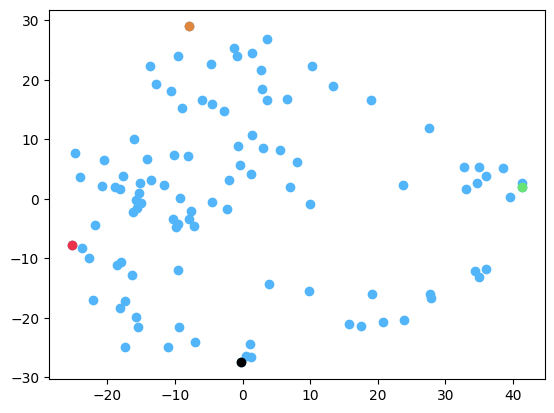

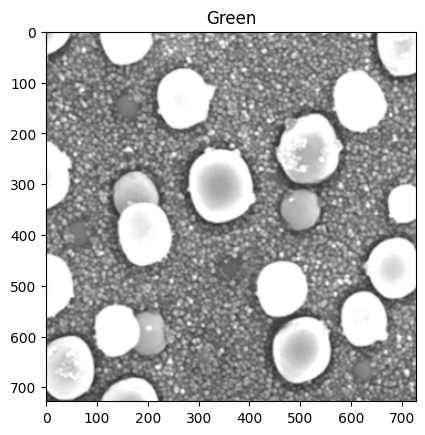

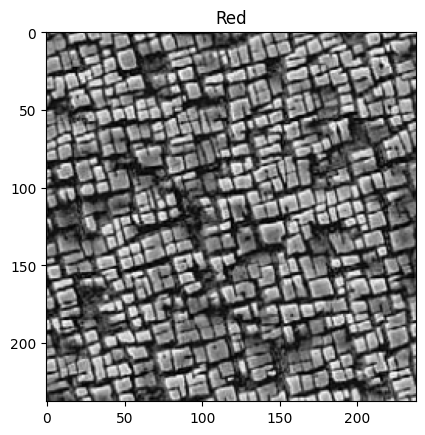

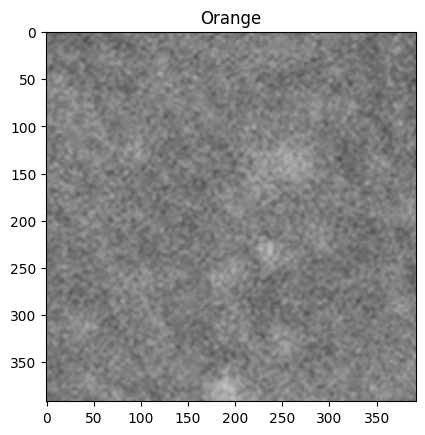

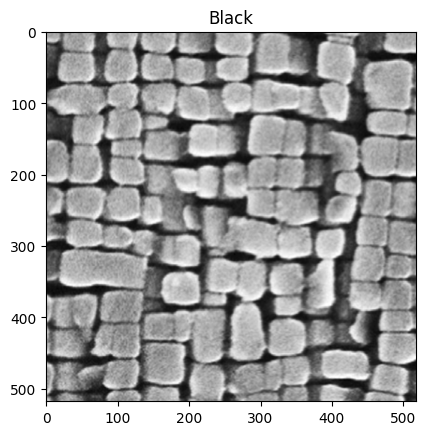

In [86]:
Scatter_PCA(x_features_small)
Scatter_PCA(x_features_base)
Scatter_PCA(x_features_large)
Scatter_PCA(x_features_giant)

In [101]:
def screeplot(X,y,n=10,order=3,scree=True):

    pca = PCA(
        svd_solver='full',
        n_components=30,
        random_state=10
    ).fit(X)

    #Calculate cumulative explained variance
    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    
    # Find the number of components explaining 90% variance
    n_components_90 = np.argmax(cumulative_variance >= 0.90) + 1

    print(n_components_90)
    components = np.linspace(1,30,30)


    xs = [1,5,10,15,20,25,30]

    print (components)
    if scree: 
        fig = plt.figure()
        plt.stem(components + 0.2, np.cumsum(pca.explained_variance_ratio_),linefmt = '#52B5F9', label = "Cumulative Explained Variance")# linefmt=f'{color}-', markerfmt=f'{color}o', basefmt='k')  # 'k' is for black color for the baseline
        #plt.plot(np.cumsum(pca.explained_variance_ratio_))
        plt.stem(components - 0.2, pca.explained_variance_ratio_, linefmt = '#EA334B', label = "Explained Variance")
        plt.xlabel('Number of Components', fontsize = 18)
        plt.ylabel('Explained Variance', fontsize = 18)
        plt.ylim(0,1)
        plt.xlim(0.5,30.5)
        plt.xticks(xs) 
        #plt.title('Scree Plot')
        #plt.legend()
        #plt.grid()
    #plt.save('Scree.pdf')
        fig.savefig('Scree.pdf', bbox_inches='tight')
    plt.show()

    return

30
[ 1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16. 17. 18.
 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30.]


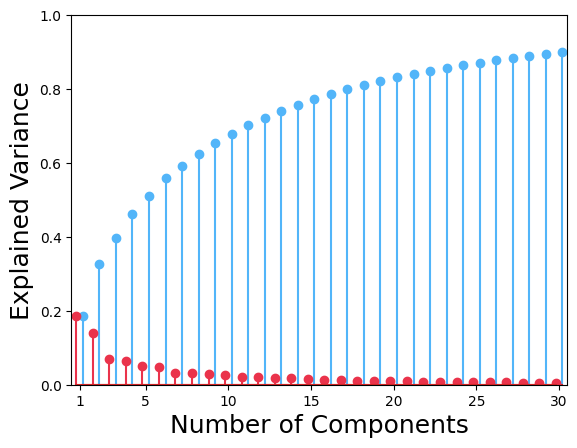

In [102]:
screeplot(x_features_small,y)

In [237]:
def make_patch_features(x_bin):
    img = Image.fromarray(x_bin)
    img_t = transform(img)
    print (img_t.shape)
    features_dict = dinov2_vitb14.forward_features(img_t.unsqueeze(0))
    features = features_dict['x_norm_patchtokens']
    #total_features.append(features)

    return features

In [457]:
xs_3 = xs[51:52]

print (xs_3.shape)

(1,)


In [458]:
total_features = []
for x in xs_3:
    feature = make_patch_features(x)
    #total_features.append(feature)

features = feature.detach().numpy()
total_features = np.squeeze(features)
total_features.shape



torch.Size([3, 728, 728])


(2704, 768)

(2704, 768)


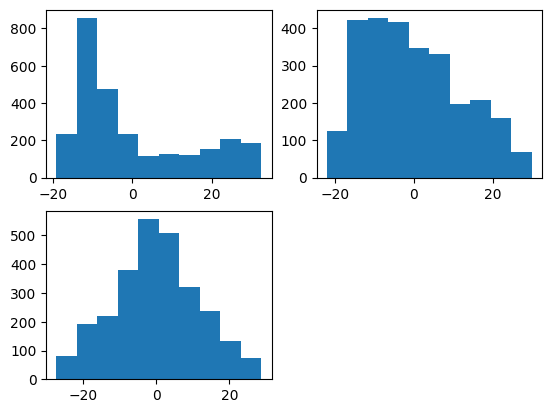

In [459]:
# Exploring Dino features

from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

patch_h = 728//14 #532//14#616//14 #658//14 #532//14 #
patch_w = 728//14 #532//14#616//14 #658//14 #532//14 #

feat_dim = 768

#total_features = features

print (total_features.shape)

# First PCA to Seperate Background
# sklearn expects 2d array for traning
total_features = total_features.reshape(1 * patch_h * patch_w, feat_dim) #4(*H*w, 1024)

pca = PCA(n_components=3)
pca.fit(total_features)
pca_features = pca.transform(total_features)

# visualize PCA components for finding a proper threshold
# 3 histograms for 3 components
plt.subplot(2, 2, 1)
plt.hist(pca_features[:, 0])
plt.subplot(2, 2, 2)
plt.hist(pca_features[:, 1])
plt.subplot(2, 2, 3)
plt.hist(pca_features[:, 2])
plt.show()
plt.close()

(2704, 3)


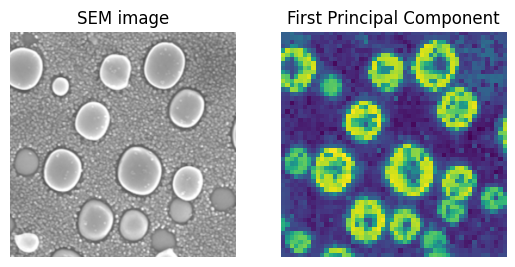

In [480]:

# min_max scale
pca_features[:, 0] = (pca_features[:, 0] - pca_features[:, 0].min()) / \
                     (pca_features[:, 0].max() - pca_features[:, 0].min())
#pca_features = sklearn.processing.minmax_scale(pca_features)

print (pca_features.shape)

for i in range(1):
    #print (xs[i].shape[0])
    #height = xs[i].shape[0]
    #width = xs[i].shape[1]
    #patch_h  = height//14
    #patch_w  = width//14

    # print (patch_h,patch_w)
    # plt.subplot(2, 2, i+1)
    # plt.imshow(pca_features[i*patch_h*patch_w : (i+1)*patch_h*patch_w, 0].reshape(patch_h, patch_w))
    # plt.colorbar()
    #plt.imshow(xs[51])

    fig = plt.figure()

    #ax1 = fig.add_subplot(231,aspect='equal')
    axis = fig.subplots(1, 2) 

    # For Cosine Function 
    axis[0].imshow(xs[51])
    axis[0].set_title("SEM image") 
    axis[0].axis('off')
  
    # For Sine Function 
    one = axis[1].imshow(pca_features[i*patch_h*patch_w : (i+1)*patch_h*patch_w, 0].reshape(patch_h, patch_w))
    axis[1].set_title("First Principal Component") 
    axis[1].axis('off')
    #fig.colorbar(one)
      
    

plt.show()


# plt.imshow(xs[51])
# plt.show()

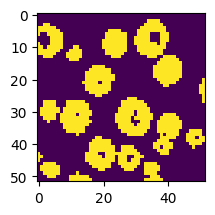

In [461]:
# segment/seperate the backgound and foreground using the first component
pca_features_bg = pca_features[:, 0] > 0.45 # from first histogram
pca_features_fg = ~pca_features_bg

# plot the pca_features_bg
for i in range(1):
    plt.subplot(2, 2, i+1)
    plt.imshow(pca_features_bg[i * patch_h * patch_w: (i+1) * patch_h * patch_w].reshape(patch_h, patch_w))
plt.show()

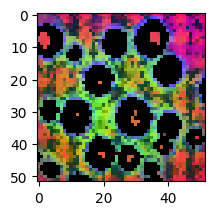

In [462]:
# 2nd PCA for only foreground patches
pca.fit(total_features[pca_features_fg]) 
pca_features_left = pca.transform(total_features[pca_features_fg])

for i in range(3):
    # min_max scaling
    pca_features_left[:, i] = (pca_features_left[:, i] - pca_features_left[:, i].min()) / (pca_features_left[:, i].max() - pca_features_left[:, i].min())

pca_features_rgb = pca_features.copy()
# for black background
pca_features_rgb[pca_features_bg] = 0
# new scaled foreground features
pca_features_rgb[pca_features_fg] = pca_features_left

# reshaping to numpy image format
pca_features_rgb = pca_features_rgb.reshape(1, patch_h, patch_w, 3)
for i in range(1):
    plt.subplot(2, 2, i+1)
    plt.imshow(pca_features_rgb[i])

plt.show()

In [232]:
total_features = []
for x in xs_3:
    feature = make_patch_features(x)
    #total_features.append(feature)

features = feature.detach().numpy()
total_features = np.squeeze(features)
total_features.shape


torch.Size([3, 616, 616])


(1936, 768)

In [234]:
ax0 = np.mean(total_features,axis = 0)
#ax1 = np.mean(total_features,axis = 1)

print (ax0.shape)
#print (ax1.shape)

print (ax0)

(768,)
[ 4.96956587e-01 -4.95404333e-01  7.24397600e-01  6.21074021e-01
 -3.87777597e-01 -2.39132810e+00 -4.01470602e-01 -1.42239881e+00
 -5.17059751e-02 -4.32276338e-01  3.80011089e-02 -5.87364674e-01
 -8.65008950e-01  1.22025692e+00  3.36770982e-01  4.84285086e-01
 -4.08280522e-01  1.39070332e+00 -6.76791966e-01 -2.13362813e+00
 -1.24959099e+00 -2.22704411e+00 -1.54107332e-01 -9.81101215e-01
  2.57719815e-01 -8.24822545e-01  2.61821532e+00  6.35960817e-01
 -7.03470647e-01  3.53806227e-01  1.75445545e+00  3.55150163e-01
  3.06330502e-01  3.01086366e-01 -4.27352488e-02 -3.18988055e-01
 -3.38414580e-01 -3.86389089e+00 -6.25939295e-02  3.11094671e-02
 -3.03067732e+00  3.99006844e-01  2.60461755e-02 -2.59478122e-01
 -1.16908062e+00 -6.70302987e-01 -2.46360564e+00  2.29065061e+00
  4.65184301e-01 -5.36254704e-01  6.34830594e-01 -2.28540111e+00
  1.47167504e+00  1.82282597e-01 -1.13921575e-01  1.01568592e+00
 -7.92587578e-01 -1.48570275e+00 -8.57829928e-01  1.43106267e-01
  1.68557727e+00 -

In [225]:
#total_features = []
for x in xs_3:
    feature_single = make_features(x)
    #total_features.append(feature)

#features = feature.detach().numpy()
total_features_single = np.squeeze(feature_single)
total_features_single.shape

(768,)

In [226]:
print (total_features_single)


[ 9.22027290e-01 -2.80449659e-01  2.41051626e+00 -9.02609408e-01
 -1.67201936e+00 -4.78852987e+00 -2.19468951e+00 -1.15199804e-01
 -7.37725496e-01  4.31796014e-01 -2.53376412e+00 -3.05292130e+00
 -1.63388145e+00  6.16089344e-01 -1.08331311e+00 -5.75849533e-01
  1.76806808e+00  2.13831663e+00  9.89583790e-01  9.29984808e-01
  9.11882281e-01 -2.11636114e+00  1.38559330e+00  2.56514251e-01
 -2.57806897e-01 -6.66948378e-01  1.78383958e+00  5.87757111e-01
  1.53292632e+00 -2.34715745e-01 -4.04902339e-01  2.31654978e+00
 -1.43881154e+00  3.20931220e+00  1.39167237e+00  3.05386484e-01
  1.47505212e+00 -3.65554476e+00  5.48957825e-01  6.90500796e-01
 -3.25545907e+00  1.07017684e+00  1.67260993e+00 -2.67733192e+00
  7.40613759e-01  4.59013939e-01 -2.65099311e+00  2.27215242e+00
  8.53462756e-01 -1.73541963e+00  2.48038387e+00 -2.00628591e+00
  3.54276586e+00  6.06685579e-01  5.72413683e-01  2.13730907e+00
  3.07803780e-01 -5.67648172e-01 -6.93696260e-01 -5.41735172e-01
  9.36258912e-01 -3.89908

In [482]:
print (x_features.shape)

(103, 768)


In [490]:
pca = PCA(
    svd_solver='full',
    n_components=26,
    random_state=10
).fit(x_features)
    
    
x_red = pca.transform(x_features)


print (x_red.shape)

(103, 26)


In [491]:
pca.components_.shape

(26, 768)

0.12177844 568
-0.12145554 440


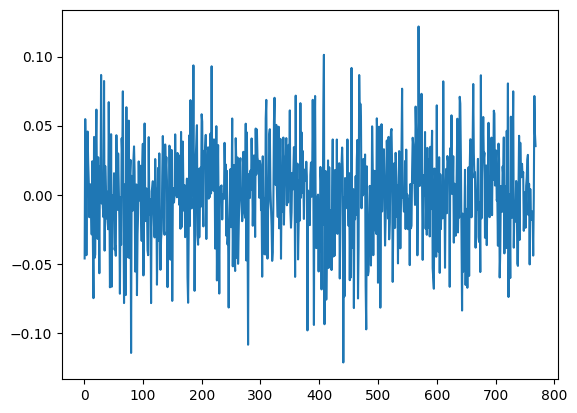

0.10106299 311
-0.09734715 363


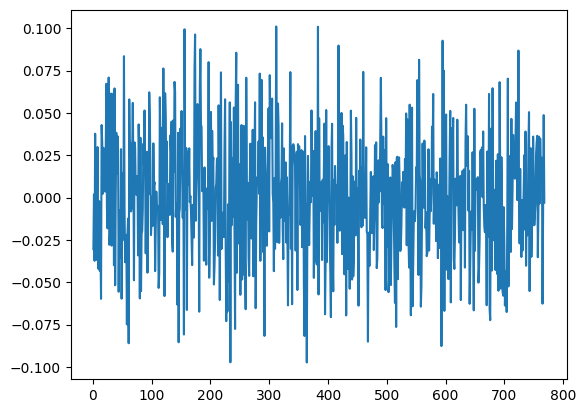

0.11191378 566
-0.11176296 74


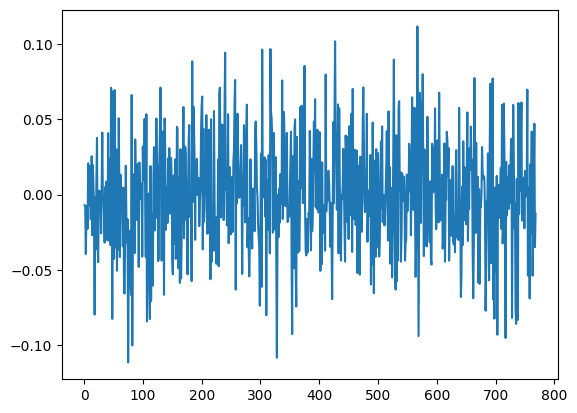

0.11486158 472
-0.13110445 275


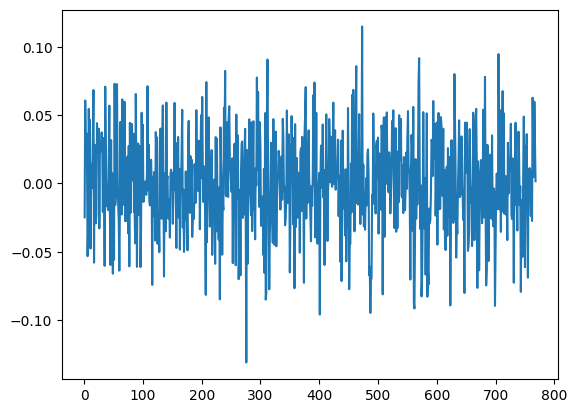

0.092632614 677
-0.1022075 553


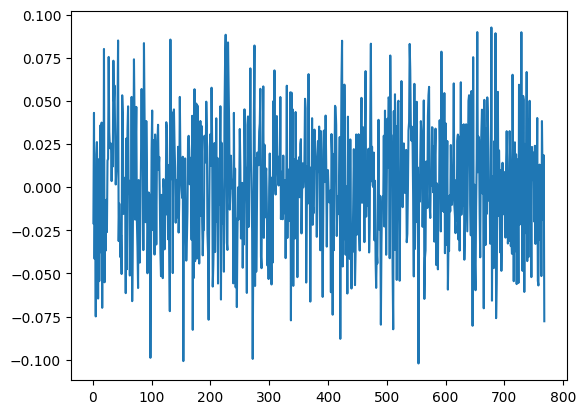

0.13479085 468
-0.110510916 568


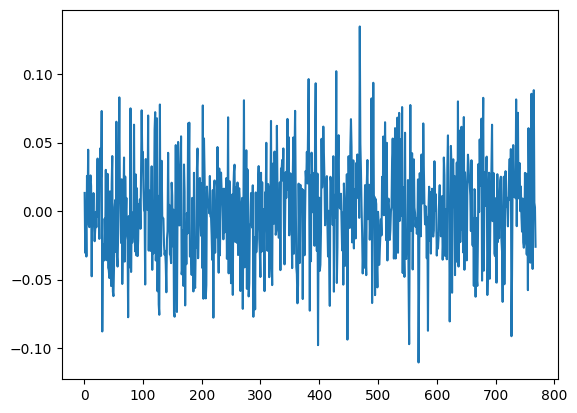

0.116859846 501
-0.13796017 717


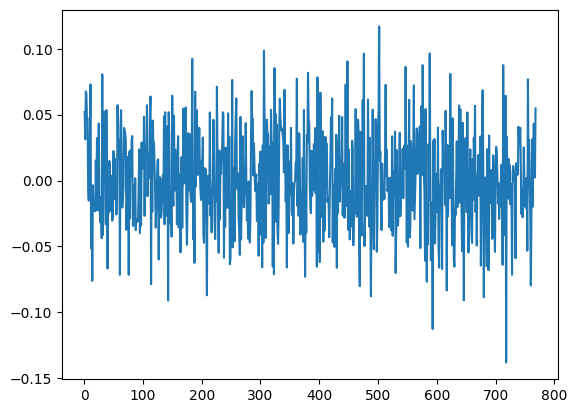

0.10695836 134
-0.09159421 643


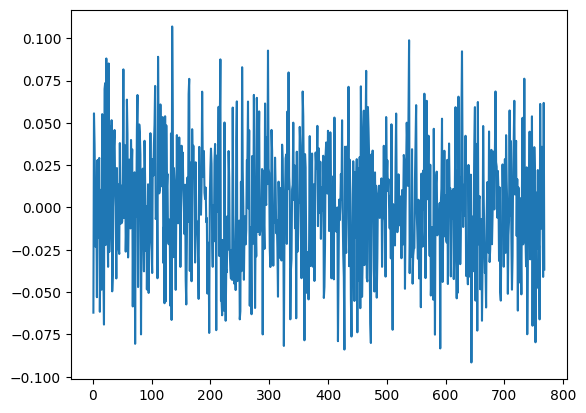

0.10885238 700
-0.11695866 587


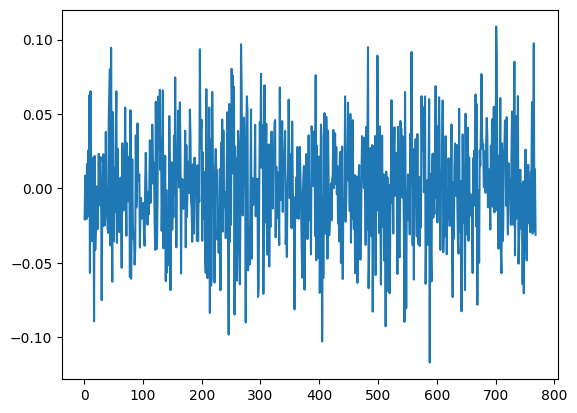

0.101810984 139
-0.11512102 279


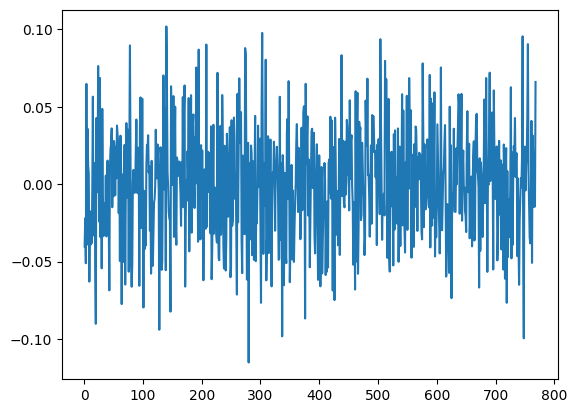

0.13694994 373
-0.13018991 143


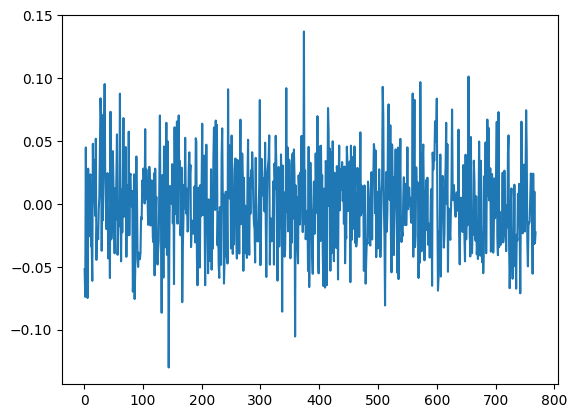

0.10512252 295
-0.10787379 345


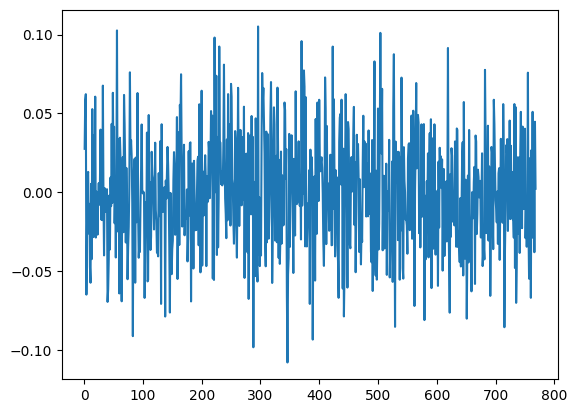

0.09937529 686
-0.11897786 186


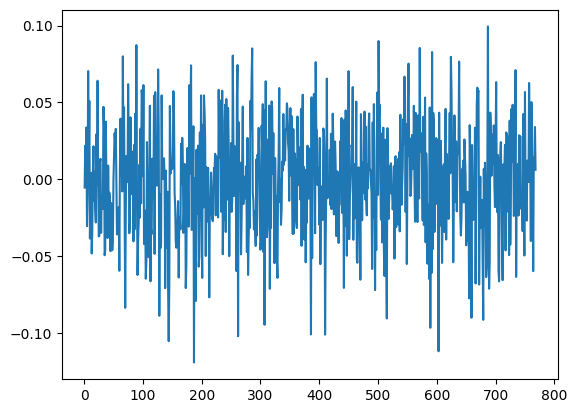

0.10057059 631
-0.11412979 571


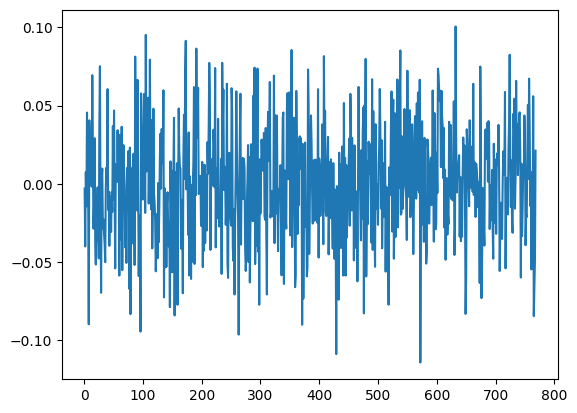

0.12257732 435
-0.10088795 45


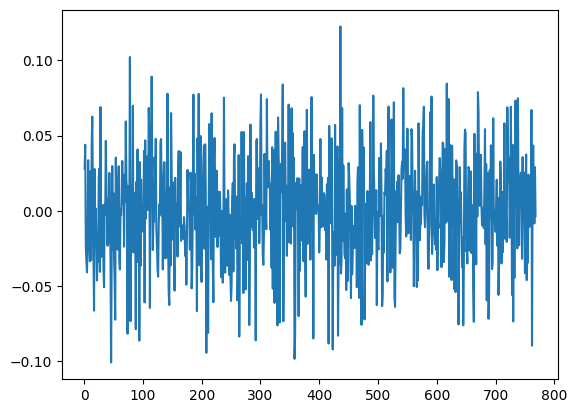

0.10563285 126
-0.11889679 465


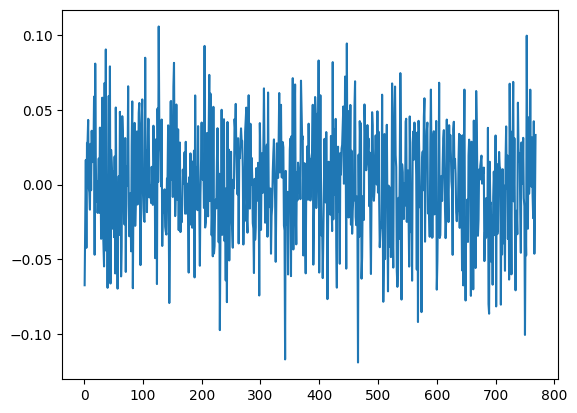

0.117048346 272
-0.10773041 142


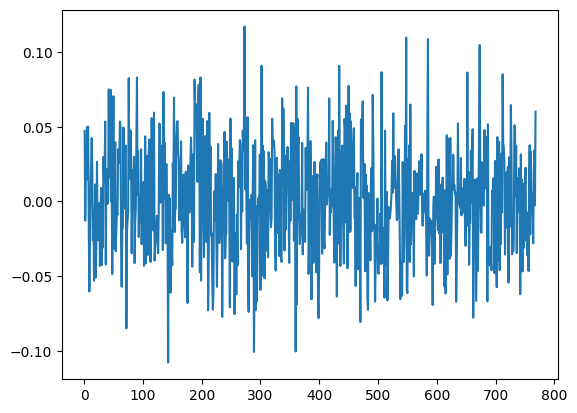

0.11304464 216
-0.10193872 422


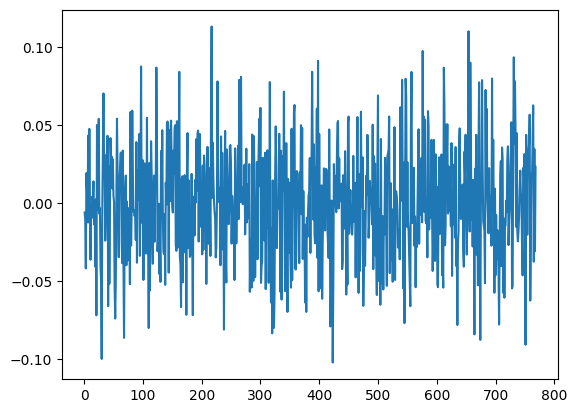

0.10477346 658
-0.11003228 86


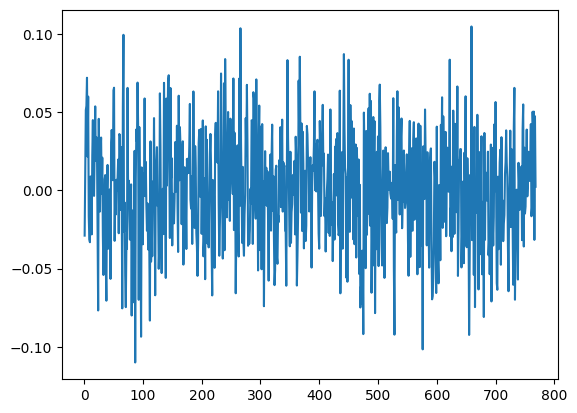

0.11989092 502
-0.10347413 305


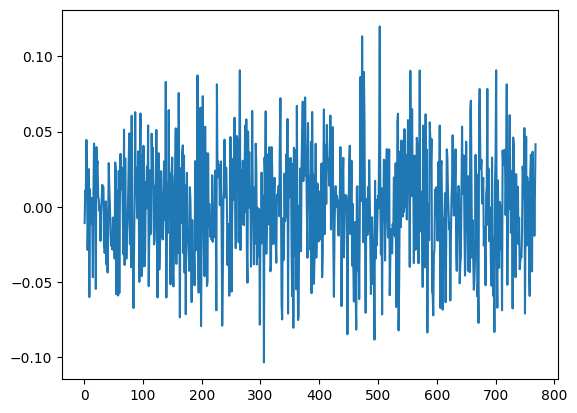

0.10682587 183
-0.10692989 746


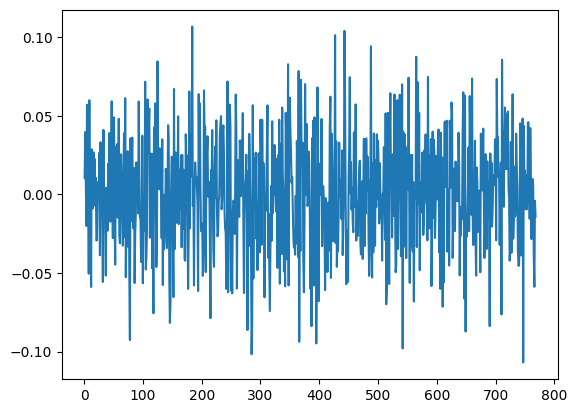

0.099213034 533
-0.11437071 594


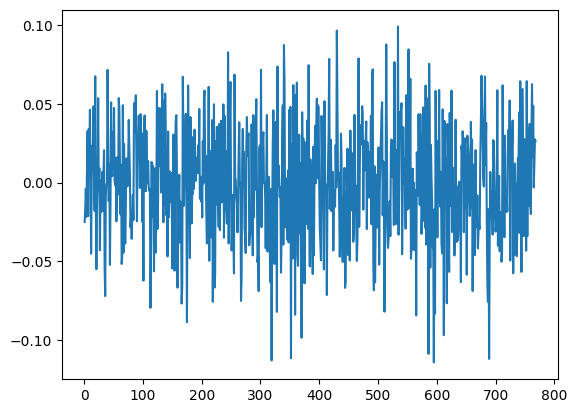

0.12268647 562
-0.09675331 235


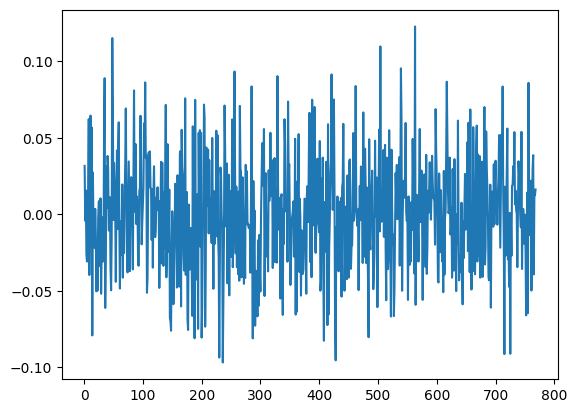

0.10622213 753
-0.100912295 657


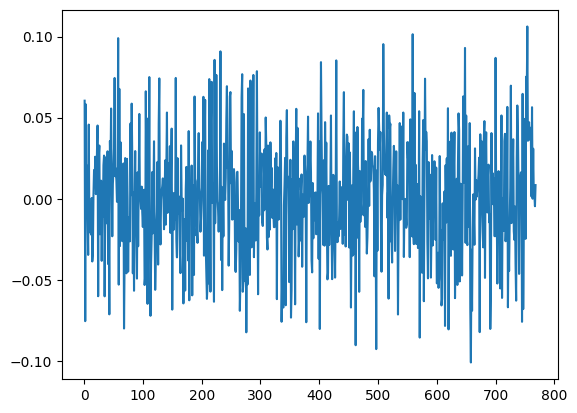

0.12425509 412
-0.109006785 342


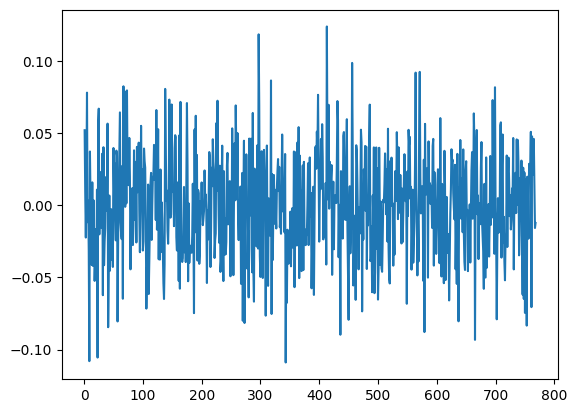

0.10625262 198
-0.10080872 223


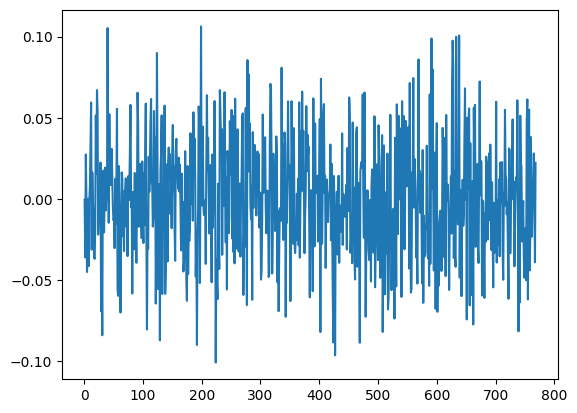

In [495]:
Xs = np.arange(1, 769)

for i in range(0,len(pca.components_)):
    print (np.max(pca.components_[i]), np.argmax(pca.components_[i]))
    print (np.min(pca.components_[i]), np.argmin(pca.components_[i]))
    plt.plot(Xs, pca.components_[i])
    plt.show()

In [519]:
feat_cols = ['PC'+str(i) for i in range(1,x_red.shape[1]+1)]

testing = pd.DataFrame(x_red,columns=feat_cols)



<bound method NDFrame.head of            PC1        PC2       PC3       PC4       PC5        PC6       PC7  \
0    11.276231 -20.420025  2.301615 -0.467030  2.485043   6.739665 -7.060639   
1    13.582378 -15.591176  4.055677  2.607640  4.774629   8.628544 -1.357879   
2    18.546658 -18.278086  3.816760 -1.297895 -1.625779   6.859779 -3.518242   
3    15.329100 -16.395823  2.849220  2.144964  0.063218   7.717769  0.224469   
4    21.064550 -11.505794  1.565373 -3.038852 -2.332393   5.515614 -1.773421   
..         ...        ...       ...       ...       ...        ...       ...   
98  -22.631346  -3.931546 -7.370929 -1.891173  8.776943 -12.611573  6.833194   
99  -17.478113  -6.511603 -4.370821  5.932431  9.379725 -14.761078  6.962146   
100   8.656384  24.166594 -6.817618 -8.591479 -0.135092  -9.115507 -9.140536   
101   5.288735  17.758841 -2.813933  8.849529 -4.390625  -6.794443  5.211995   
102  10.932667  19.522593 -7.624227 -3.568748 -4.270958 -10.072785 -8.639027   

         

In [506]:
feature = make_patch_features(xs[51])
features = feature.detach().numpy()
total_features = np.squeeze(features)
total_features.shape


torch.Size([3, 728, 728])


(2704, 768)

In [507]:
new_img = total_features[:,568].reshape(52,52)

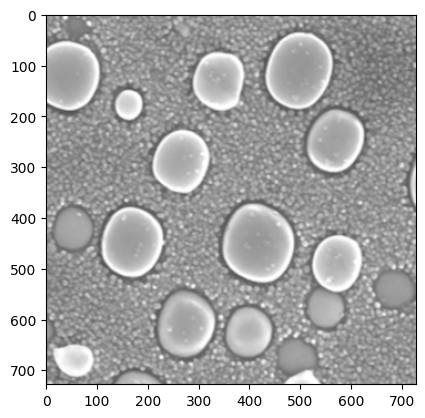

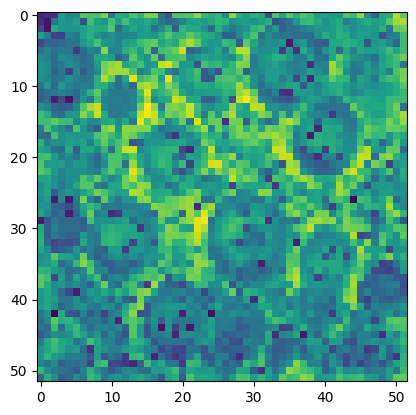

In [508]:
plt.imshow(xs[51])
plt.show()

plt.imshow(new_img)
plt.show()

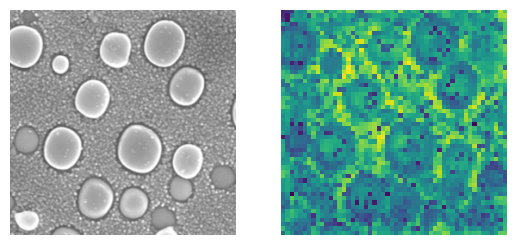

In [509]:
fig = plt.figure()

#ax1 = fig.add_subplot(231,aspect='equal')
axis = fig.subplots(1, 2) 

# For Cosine Function 
axis[0].imshow(xs[51])
#axis[0].set_title("SEM image") 
axis[0].axis('off')

# For Sine Function 
one = axis[1].imshow(new_img)
#axis[1].set_title("First Principal Component") 
axis[1].axis('off')
#fig.colorbar(one)
      
    

plt.show()


In [510]:
def Visualize_feature(val, img_num):
    feature = make_patch_features(xs[img_num])
    features = feature.detach().numpy()
    total_features = np.squeeze(features)

    patch = len(xs[img_num])//14

    new_img = total_features[:,val].reshape(patch,patch)

    fig = plt.figure()

    axis = fig.subplots(1, 2) 
 
    axis[0].imshow(xs[img_num])
    #axis[0].set_title("SEM image") 
    axis[0].axis('off')

    one = axis[1].imshow(new_img)
    #axis[1].set_title("First Principal Component") 
    axis[1].axis('off')
    #fig.colorbar(one)
          
        
    
    plt.show()

    

torch.Size([3, 812, 812])


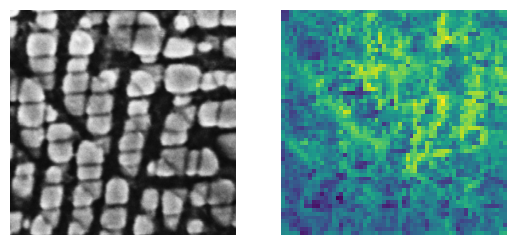

In [513]:
Visualize_feature(568,81)

torch.Size([3, 910, 910])


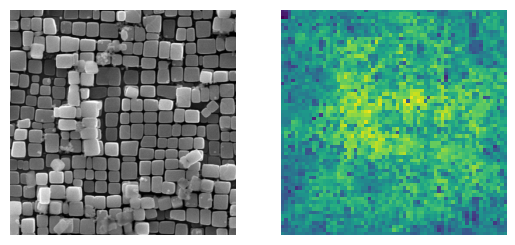

In [514]:
Visualize_feature(568,76)

In [520]:
x_features.shape


(103, 768)

In [521]:
maxs = np.amax(x_features, axis=0)
mins = np.amin(x_features, axis=0)

print (maxs.shape)
print (mins.shape)

(768,)
(768,)


In [539]:
ranges = maxs - mins

range_sorted = np.sort(range)
range_sorted = range_sorted[760:]

print (ranges)
print (len(range_sorted))
print (ranges.shape)

ranges = ranges.tolist()

indexs = []
for val in range_sorted:
    indexs.append(ranges.index(val))

[ 6.8289976   7.4853992   5.63763     7.4173813   6.4048533   6.2496624
  5.1625824   5.319785    6.340617    5.018813    5.8423285   5.2914743
  5.241091    6.019786    5.6133833   6.658987    5.0703735   6.040242
  6.7578526   7.5623293   6.094595    5.038993    6.2927084   4.4132743
  5.0255604   5.069049    8.348469    4.7663703   6.556017    6.1317563
  7.0552435   4.7327785   4.6654267   6.6570473   8.050657    7.593831
  6.089345    5.8380404   0.48897848  6.4192877   6.659615    6.4597025
  6.3141274   7.122143    7.3654757   6.907348    6.059629    7.02582
  7.311478    6.0013165   5.6436563   7.7047205   6.7250223   5.4553804
  6.568407    6.722639    4.704175    7.405485    5.457945    6.483506
  8.446906    5.378527    6.1978397   6.126171    6.069396    6.5392823
  6.523478    7.505124    5.337166    6.5908895   6.499441    6.9048276
  4.7901363   6.685934    7.8937516   6.4011054   7.530224    8.03536
  7.1215763   8.881018    7.310713    8.02616     7.3668103   5.0623436

In [524]:
print (np.argmax(range))


568


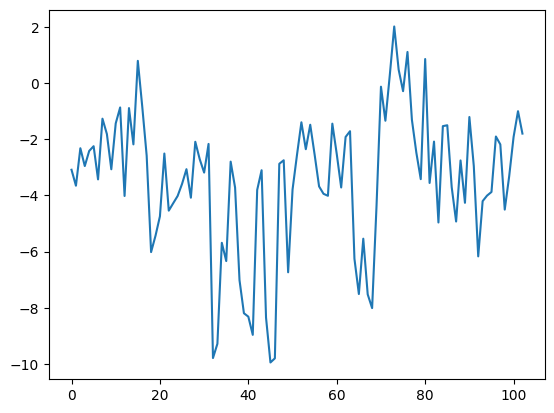

In [525]:
plt.plot(x_features[:,568])
plt.show()

In [526]:
print (np.argmax(x_features[:,568]))
print (np.argmin(x_features[:,568]))

73
45


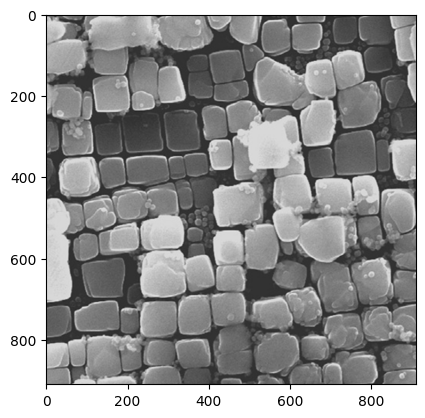

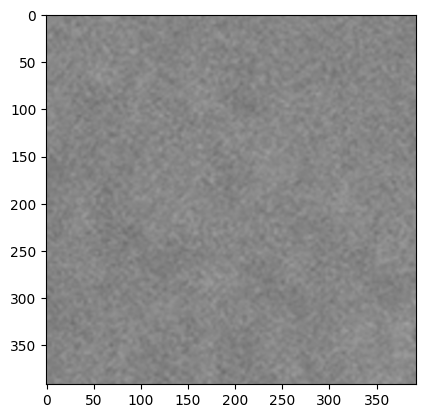

In [528]:
plt.imshow(xs[73])
plt.show()

plt.imshow(xs[45])
plt.show()

In [61]:
def VisualizeFeatureofInterest(feature):
    feature_spectra = x_features[:,feature]

    plt.ylim([-10,10])
    plt.plot(feature_spectra)
    plt.show()

    max_img = np.argmax(feature_spectra)
    min_img = np.argmin(feature_spectra)

    plt.imshow(xs[max_img])
    plt.show()

    plt.imshow(xs[min_img])
    plt.show()

    # #fig = plt.figure()

    # #axis = fig.subplots(1, 2) 
 
    # #axis[0].imshow(max_img)
    # axis[0].axis('off')

    # one = axis[1].imshow(min_img)
    # axis[1].axis('off')

    # plt.show()

    

In [62]:
for val in indexs:
    VisualizeFeatureofInterest(val)

NameError: name 'indexs' is not defined

In [546]:
dinov2_vitb14

DinoVisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 768, kernel_size=(14, 14), stride=(14, 14))
    (norm): Identity()
  )
  (blocks): ModuleList(
    (0-11): 12 x NestedTensorBlock(
      (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (attn): MemEffAttention(
        (qkv): Linear(in_features=768, out_features=2304, bias=True)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=768, out_features=768, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): LayerScale()
      (drop_path1): Identity()
      (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=768, out_features=3072, bias=True)
        (act): GELU(approximate='none')
        (fc2): Linear(in_features=3072, out_features=768, bias=True)
        (drop): Dropout(p=0.0, inplace=False)
      )
      (ls2): LayerScale()
      (drop_path2): Identity()
    )
  )
  (n